In [1]:
#for data manipulations
import numpy as np
import pandas as pd
import scipy.stats as stats
import plotly.graph_objects as go
#for data visualizations
import matplotlib.pyplot as plt
import seaborn as sns
#for interactive analysis
from ipywidgets import interact

In [2]:
#Reading the dataset
data_1 = pd.read_csv("Agri Project Data With Outlier.csv")
data_2 = pd.read_csv("Agri Project Data Without Oulier.csv")

In [5]:
#Getting to know the informations of the dataset i.e., the data type and number of non-null values in each column
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Nitrogen     2200 non-null   float64
 1   Phosphorus   2200 non-null   float64
 2   Potassium    2200 non-null   float64
 3   Temperature  2200 non-null   float64
 4   Humidity     2200 non-null   float64
 5   pH           2200 non-null   float64
 6   Rainfall     2200 non-null   float64
 7   Crop         2200 non-null   object 
dtypes: float64(7), object(1)
memory usage: 137.6+ KB


In [6]:
#Getting the dimensions of the dataset
print("Shape of the dataset :", data_1.shape)

Shape of the dataset : (2200, 8)


In [7]:
#Checking the first 5 rows & columns of the dataset
data_1.head()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop
0,90.0,42.0,43.0,20.88,82.00,6.50,202.94,rice
1,85.0,58.0,41.0,21.77,80.32,7.04,226.66,rice
2,60.0,55.0,44.0,23.00,82.32,7.84,263.96,rice
3,74.0,35.0,40.0,26.49,80.16,6.98,242.86,rice
4,78.0,42.0,42.0,20.13,81.60,7.63,262.72,rice


In [9]:
#Checking the missing values as individual
data_1.isnull()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
2195,False,False,False,False,False,False,False,False
2196,False,False,False,False,False,False,False,False
2197,False,False,False,False,False,False,False,False
2198,False,False,False,False,False,False,False,False


In [14]:
#Checking the missing values as individual
missing_values = pd.isnull(data_1)     
data_1[missing_values] 

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
2195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2196,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
#Checking the missing values as displaying data only with Crop = NaN (Not A Number)
missing_crop = pd.isnull(data_1["Crop"])     
data_1[missing_crop] 

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop


In [15]:
#Checking the missing values as sum of the dataset
data_1.isnull().sum()

Nitrogen       0
Phosphorus     0
Potassium      0
Temperature    0
Humidity       0
pH             0
Rainfall       0
Crop           0
dtype: int64

In [27]:
#Getting the number of rows in the dataset
num_rows = data_1.shape[0]
print("Number of rows:", num_rows)

#Getting the number of columns in the dataset
num_columns = data_1.shape[1]
print("Number of columns:", num_columns)

Number of rows: 2200
Number of columns: 8


In [23]:
#Getting the names of columns in the dataset
data_columns =list(data_1.columns)
print("List of Columns in dataset : ", data_columns)

List of Columns in dataset :  ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall', 'Crop']


In [6]:
#Getting the number of columns in the dataset
column_num = len(data_1.columns)
print("Number of Columns in our dataset : ",column_num)

Number of Columns in our dataset :  8


In [24]:
#Getting the names of crops in the dataset
crop_yields = list(data_1["Crop"].unique())
print("List of Crops in dataset : ", crop_yields)

List of Crops in dataset :  ['rice', 'maize', 'chickpea', 'kidneybeans', 'pigeonpeas', 'mothbeans', 'mungbean', 'blackgram', 'lentil', 'pomegranate', 'banana', 'mango', 'grapes', 'watermelon', 'muskmelon', 'apple', 'orange', 'papaya', 'coconut', 'cotton', 'jute', 'coffee']


In [25]:
#Getting the number of crops in the dataset
crop_numbers = len(data_1["Crop"].unique())
print("Number of various crops: ", crop_numbers)

Number of various crops:  22


In [18]:
# Checking the data types of the column values of the dataset
data_1.dtypes

Nitrogen       float64
Phosphorus     float64
Potassium      float64
Temperature    float64
Humidity       float64
pH             float64
Rainfall       float64
Crop            object
dtype: object

In [19]:
# Checking for duplicated values as individual in the dataset
data_1.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
2195    False
2196    False
2197    False
2198    False
2199    False
Length: 2200, dtype: bool

In [22]:
# Check for duplicated values as sum in the dataset
duplicates = data_1.duplicated()
print("Number of duplicate rows:", duplicates.sum())

Number of duplicate rows: 0


In [28]:
# Calculate the frequency distribution of a "Crop" column in the dataset
#Checking the crops present in the dataset
data_1['Crop'].value_counts()

rice           100
maize          100
jute           100
cotton         100
coconut        100
papaya         100
orange         100
apple          100
muskmelon      100
watermelon     100
grapes         100
mango          100
banana         100
pomegranate    100
lentil         100
blackgram      100
mungbean       100
mothbeans      100
pigeonpeas     100
kidneybeans    100
chickpea       100
coffee         100
Name: Crop, dtype: int64

Descriptive statistics: This includes measures such as mean, median, mode, range, variance, and standard deviation. These measures can be used to summarize the data and provide insight into the central tendency and spread of the data.

In [32]:
#Descriptive statistics 1:
#Calculating descriptive statistics on the datatset before deleting Outliers
data_1.describe()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616136,71.481877,6.469445,103.463691
std,36.917334,32.985883,50.647931,5.063700,22.263811,0.773905,54.958311
min,0.000000,5.000000,5.000000,8.830000,14.260000,3.500000,20.210000
25%,21.000000,28.000000,20.000000,22.770000,60.262500,5.970000,64.552500
50%,37.000000,51.000000,32.000000,25.600000,80.470000,6.425000,94.865000
75%,84.250000,68.000000,49.000000,28.560000,89.950000,6.920000,124.270000
max,140.000000,145.000000,205.000000,43.680000,99.980000,9.940000,298.560000


In [34]:
#Descriptive statistics 2:
#Getting the descriptive statistics of "Crops" column of the dataset
data_1["Crop"].describe()

count     2200
unique      22
top       rice
freq       100
Name: Crop, dtype: object

Correlation analysis: This involves calculating the correlation coefficient between different variables in the dataset. Correlation analysis can be used to identify relationships between different variables in the data, such as the relationship between crop yield and weather variables like temperature and rainfall. The correlation coefficient ranges between -1 and 1, where -1 indicates a perfect negative correlation, 0 indicates no correlation, and 1 indicates a perfect positive correlation. 

Covariance is a measure of the joint variability of two variables in a dataset. Note that the diagonal elements of the covariance matrix represent the variance of each variable.Covariance, on the other hand, takes a value between negative infinity and positive infinity, where negative values indicate a negative association, positive values indicate a positive association, and 0 indicates no association.

In [44]:
#Checking the correlation and covariance of climatic and soil requirements
#Finding the covariance between the climatic and soil requirements
data_1.cov()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
Nitrogen,1362.889537,-281.860096,-262.727147,4.954129,156.729591,2.764522,119.747730
Phosphorus,-281.860096,1088.068460,1229.998647,-21.302754,-87.196025,-3.523428,-115.731526
Potassium,-262.727147,1229.998647,2565.212869,-41.134230,215.216655,-6.642932,-148.809341
Temperature,4.954129,-21.302754,-41.134230,25.641060,23.147892,-0.070220,-8.371593
Humidity,156.729591,-87.196025,215.216655,23.147892,495.677267,-0.146485,115.528545
pH,2.764522,-3.523428,-6.642932,-0.070220,-0.146485,0.598928,-4.643130
Rainfall,119.747730,-115.731526,-148.809341,-8.371593,115.528545,-4.643130,3020.415938


In [37]:
#Finding the correlation analysis between the climatic and soil requirements
data_1.corr()

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall
Nitrogen,1.000000,-0.231460,-0.140512,0.026501,0.190687,0.096761,0.059021
Phosphorus,-0.231460,1.000000,0.736232,-0.127538,-0.118732,-0.138022,-0.063840
Potassium,-0.140512,0.736232,1.000000,-0.160389,0.190860,-0.169477,-0.053461
Temperature,0.026501,-0.127538,-0.160389,1.000000,0.205326,-0.017919,-0.030082
Humidity,0.190687,-0.118732,0.190860,0.205326,1.000000,-0.008502,0.094418
pH,0.096761,-0.138022,-0.169477,-0.017919,-0.008502,1.000000,-0.109167
Rainfall,0.059021,-0.063840,-0.053461,-0.030082,0.094418,-0.109167,1.000000


Hypothesis testing: This involves testing a hypothesis about the data using statistical methods. For example, one might test whether there is a significant difference in yield between two different fertilizer treatments or whether a particular management practice has a significant effect on crop growth.It uses the ttest_ind() function to calculate the t-statistic and p-value for the two-sample t-test. The ttest_ind() function takes two arrays of data as input and returns a tuple containing the t-statistic and two-tailed p-value. The t-statistic is a measure of the difference between the means of the two samples, normalized by their standard errors. The p-value is a measure of the probability of observing a difference as large as the one observed in the samples, assuming that the null hypothesis (i.e., the two populations have equal means) is true. You can use the t-statistic and p-value to make a decision about whether to reject or fail to reject the null hypothesis. Typically, if the p-value is less than a chosen significance level (e.g., 0.05), then you would reject the null hypothesis and conclude that there is a statistically significant difference between the two populations.

In [44]:
# Hypothesis 1:
# Doing the hypothesis testing of the crops i.e., "cotton" & "rice" in the dataset
Crops_in_dataset :  ['rice', 'maize', 'chickpea', 'pomegranate', 'banana', 'mango',  'coconut', 'cotton']
rice_data = data_1.loc[data_1["Crop"] == "rice"]
cotton_data = data_1.loc[data_1["Crop"] == "cotton"]
t, p = stats.ttest_ind(rice_data["Nitrogen"], cotton_data["Nitrogen"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: -22.74889722194593
p-value: 3.8489252207759007e-57
There is a statistically significant difference between the two crops.


In [45]:
# Hypothesis 2:
# Doing the hypothesis testing of the crops i.e., "coconut" & "rice" in the dataset
Crops_in_dataset :  ['rice', 'maize', 'chickpea', 'pomegranate', 'banana', 'mango',  'coconut', 'cotton']
rice_data = data_1.loc[data_1["Crop"] == "rice"]
coconut_data = data_1.loc[data_1["Crop"] == "coconut"]
t, p = stats.ttest_ind(rice_data["Rainfall"], coconut_data["Rainfall"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: 13.378803060588613
p-value: 1.680228070624915e-29
There is a statistically significant difference between the two crops.


In [5]:
# Hypothesis 3:
# Doing the hypothesis testing of the crops i.e., "grapes" & "papaya" in the dataset
Crops_in_dataset :  ['grapes', 'maize', 'chickpea', 'apple', 'papaya', 'banana', 'mango',  'coconut', 'cotton']
grapes_data = data_1.loc[data_1["Crop"] == "grapes"]
papaya_data = data_1.loc[data_1["Crop"] == "papaya"]
t, p = stats.ttest_ind(grapes_data["Temperature"], papaya_data["Temperature"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: -8.527568601816094
p-value: 3.83000351935611e-15
There is a statistically significant difference between the two crops.


In [50]:
# Hypothesis 4:
# Doing the hypothesis testing of the crops i.e., "grapes" & "apple" in the dataset
Crops_in_dataset :  ['grapes', 'maize', 'chickpea', 'apple', 'papaya', 'banana', 'mango',  'coconut', 'cotton']
grapes_data = data_1.loc[data_1["Crop"] == "grapes"]
apple_data = data_1.loc[data_1["Crop"] == "apple"]
t, p = stats.ttest_ind(grapes_data["Potassium"], apple_data["Potassium"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: 0.4723518305046884
p-value: 0.6371958759917975
There is no statistically significant difference between the two crops.


In [51]:
# Hypothesis 5:
# Doing the hypothesis testing of the crops i.e., "grapes" & "apple" in the dataset
Crops_in_dataset :  ['grapes', 'maize', 'chickpea', 'apple', 'papaya', 'banana', 'mango',  'coconut', 'cotton']
grapes_data = data_1.loc[data_1["Crop"] == "grapes"]
apple_data = data_1.loc[data_1["Crop"] == "apple"]
t, p = stats.ttest_ind(grapes_data["Phosphorus"], apple_data["Phosphorus"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: -1.5158094537971918
p-value: 0.1311623683346354
There is no statistically significant difference between the two crops.


In [52]:
# Hypothesis 6:
# Doing the hypothesis testing of the crops i.e., "chickpea" & "kidneybeans" in the dataset
Crops_in_dataset :  ['grapes', 'kidneybeans', 'chickpea', 'apple', 'papaya', 'banana', 'mango',  'coconut', 'cotton']
chickpea_data = data_1.loc[data_1["Crop"] == "chickpea"]
kidneybeans_data = data_1.loc[data_1["Crop"] == "kidneybeans"]
t, p = stats.ttest_ind(chickpea_data["Humidity"], kidneybeans_data["Humidity"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: -17.182400854952633
p-value: 4.174318607028061e-41
There is a statistically significant difference between the two crops.


In [53]:
# Hypothesis 7:
# Doing the hypothesis testing of the crops i.e., "mothbeans" & "mango" in the dataset
Crops_in_dataset :  ['mothbeans', 'kidneybeans', 'chickpea', 'apple', 'papaya', 'banana', 'mango',  'coconut', 'cotton']
mothbeans_data = data_1.loc[data_1["Crop"] == "mothbeans"]
mango_data = data_1.loc[data_1["Crop"] == "mango"]
t, p = stats.ttest_ind(mothbeans_data["pH"], mango_data["pH"])
print("t-value:", t)
print("p-value:", p)
if p < 0.05:
    print("There is a statistically significant difference between the two crops.")
else:
    print("There is no statistically significant difference between the two crops.")

t-value: 5.349080637392469
p-value: 2.4278707506079806e-07
There is a statistically significant difference between the two crops.


In [10]:
#Calculating the measures of central tenddency of the climatic and soil requirements of the dataset
#Checking average climatic and soil requirements
print("Average Ratio of Nitrogen in the Soil : {0:.2f}".format(data_1['Nitrogen'].mean()))
print("Average Ratio of Phosphorous in the Soil : {0:.2f}".format(data_1['Phosphorus'].mean()))
print("Average Ratio of Potassium in the Soil : {0:.2f}".format(data_1['Potassium'].mean()))
print("Average Temperature in Celsius : {0:.2f}".format(data_1['Temperature'].mean()))
print("Average Relative Humidity in % : {0:.2f}".format(data_1['Humidity'].mean()))
print("Average pH Value of the Soil : {0:.2f}".format(data_1['pH'].mean()))
print("Average Rainfall in mm : {0:.2f}".format(data_1['Rainfall'].mean()))

# Finding Mean of climatic and soil requirements
print("\nMean Ratio of Nitrogen in the Soil : ", statistics.mean(data_1["Nitrogen"]))
print("Mean Ratio of Phosphorus in the Soil : ", statistics.mean(data_1["Phosphorus"]))
print("Mean Ratio of Potassium in the Soil : ", statistics.mean(data_1["Potassium"]))
print("Mean Ratio of Temperature in the Soil : ", statistics.mean(data_1["Temperature"]))
print("Mean Ratio of Humidity in the Soil : ", statistics.mean(data_1["Humidity"]))
print("Mean Ratio of pH in the Soil : ", statistics.mean(data_1["pH"]))
print("Mean Ratio of Rainfall in the Soil : ", statistics.mean(data_1["Rainfall"]))

# Finding Median of climatic and soil requirements
print("\nMedian of Nitrogen in the Soil : ", statistics.median(data_1["Nitrogen"]))
print("Median of Phosphorus in the Soil : ", statistics.median(data_1["Phosphorus"]))
print("Median of Potassium in the Soil : ", statistics.median(data_1["Potassium"]))
print("Median of Temperature in the Soil : ", statistics.median(data_1["Temperature"]))
print("Median of Humidity in the Soil : ", statistics.median(data_1["Humidity"]))
print("Median of pH in the Soil : ", statistics.median(data_1["pH"]))
print("Median of Rainfall in the Soil : ", statistics.median(data_1["Rainfall"]))
 
# Finding Single Mode of climatic and soil requirements
print("\nSingle Mode of Nitrogen in the Soil : ", statistics.mode(data_1["Nitrogen"]))
print("Single Mode of Phosphorus in the Soil : ", statistics.mode(data_1["Phosphorus"]))
print("Single Mode of Potassium in the Soil : ", statistics.mode(data_1["Potassium"]))
print("Single Mode of Temperature in the Soil : ", statistics.mode(data_1["Temperature"]))
print("Single Mode of Humidity in the Soil : ", statistics.mode(data_1["Humidity"]))
print("Single Mode of pH in the Soil : ", statistics.mode(data_1["pH"]))
print("Single Mode of Rainfall in the Soil : ", statistics.mode(data_1["Rainfall"]),)
 
# Finding Multiple Modes of climatic and soil requirements
print("\nMode of Nitrogen in the Soil : ", statistics.multimode(data_1["Nitrogen"]))
print("Mode of Phosphorus in the Soil : ", statistics.multimode(data_1["Phosphorus"]))
print("Mode of Potassium in the Soil : ", statistics.multimode(data_1["Potassium"]))
print("Mode of Temperature in the Soil : ", statistics.multimode(data_1["Temperature"]))
print("Mode of Humidity in the Soil : ", statistics.multimode(data_1["Humidity"]))
print("Mode of pH in the Soil : ", statistics.multimode(data_1["pH"]))
print("Mode of Rainfall in the Soil : ", statistics.multimode(data_1["Rainfall"]))

# Finding the sum of climatic and soil requirements
print("\nSum of Nitrogen in the Soil : ", sum(data_1["Nitrogen"]))
print("Sum of Phosphorus in the Soil : ", sum(data_1["Phosphorus"]))
print("Sum of Potassium in the Soil : ", sum(data_1["Potassium"]))
print("Sum of Temperature in the Soil : ", sum(data_1["Temperature"]))
print("Sum of Humidity in the Soil : ", sum(data_1["Humidity"]))
print("Sum of pH in the Soil : ", sum(data_1["pH"]))
print("Sum of Rainfall in the Soil : ", sum(data_1["Rainfall"]))

Average Ratio of Nitrogen in the Soil : 50.55
Average Ratio of Phosphorous in the Soil : 53.36
Average Ratio of Potassium in the Soil : 48.15
Average Temperature in Celsius : 25.62
Average Relative Humidity in % : 71.48
Average pH Value of the Soil : 6.47
Average Rainfall in mm : 103.46

Mean Ratio of Nitrogen in the Soil :  50.551818181818184
Mean Ratio of Phosphorus in the Soil :  53.36272727272727
Mean Ratio of Potassium in the Soil :  48.14909090909091
Mean Ratio of Temperature in the Soil :  25.616136363636365
Mean Ratio of Humidity in the Soil :  71.48187727272727
Mean Ratio of pH in the Soil :  6.469445454545455
Mean Ratio of Rainfall in the Soil :  103.46369090909091

Median of Nitrogen in the Soil :  37.0
Median of Phosphorus in the Soil :  51.0
Median of Potassium in the Soil :  32.0
Median of Temperature in the Soil :  25.6
Median of Humidity in the Soil :  80.47
Median of pH in the Soil :  6.425
Median of Rainfall in the Soil :  94.86500000000001

Single Mode of Nitrogen in

Skewness:
Distribution on the basis of skewness value:

Skewness = 0: Then normally distributed.(Symmetric) Skewness > 0: Then more weight in the left tail of the distribution. Skewness < 0: Then more weight in the right tail of the distribution. Roughly Symmetric: Skewness almost 0.

If the skewness is between -1 and -0.5(negatively skewed), the data are moderately skewed. Or if the skewness is between 0.5 and 1(positively skewed), the data are moderately skewed. 
If the skewness is less than -1(negatively skewed) or greater than 1(positively skewed), the data are highly skewed.

Roughly symmetric means one where the left and right hand sides of the distribution are roughly equally balanced around the mean. A skewed (non-symmetric) distribution is a distribution in which there is no such mirror-imaging.

Kurtosis:
kurtosis for normal distribution is equal to 3(Mesokurtic:Distributions with medium kurtosis (medium tails) are mesokurtic). For a distribution having kurtosis < 3: It is called playkurtic(Distributions with low kurtosis (thin tails) are platykurtic). For a distribution having kurtosis > 3: It is called leptokurtic(Distributions with high kurtosis (fat tails) are leptokurtic) and it signifies that it tries to produce more outliers rather than the normal distribution.

In [19]:
# calculating skewness & kurtosis of each climatic and soil requirements of the dataset
print("Skewness of the different soil and climate requirements : ", "\n" , data_1.skew())
print("\nKurtosis of the different soil and climate requirements : ", "\n", data_1.kurtosis())

Skewness of the different soil and climate requirements :  
 Nitrogen       0.509721
Phosphorus     1.010773
Potassium      2.375167
Temperature    0.184958
Humidity      -1.091705
pH             0.283805
Rainfall       0.965756
dtype: float64

Kurtosis of the different soil and climate requirements :  
 Nitrogen      -1.058240
Phosphorus     0.860279
Potassium      4.449354
Temperature    1.232472
Humidity       0.302127
pH             1.658025
Rainfall       0.607078
dtype: float64


C:\Users\HP\AppData\Local\Temp\ipykernel_10660\77348506.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print("Skewness of the different soil and climate requirements : ", "\n" , data_1.skew())
C:\Users\HP\AppData\Local\Temp\ipykernel_10660\77348506.py:3: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  print("\nKurtosis of the different soil and climate requirements : ", "\n", data_1.kurtosis())


Nitrogen: Moderately Skewed. 
Phosphorus: Highly Skewed. 
Potassium: Highly Skewed. 
Temperature: Roughly Symmetric. 
Humidity: Highly Skewed. 
pH: Roughly Symmetric. 
Rainfall: Moderately Skewed.

Nitrogen: Platykurtic. 
Phosphorus: Platykurtic. 
Potassium: Leptokurtic. 
Temperature: Platykurtic. 
Humidity: Platykurtic. 
pH: Platykurtic.
Rainfall: Platykurtic.

In [37]:
#Calculating the measures of dispersion of the climatic and soil requirements of the dataset
# Check the variance between the climatic and soil requirements
print("Variance of Nitrogen in the Soil : ", statistics.variance(data_1["Nitrogen"]))
print("Variance of Phosphorus in the Soil : ", statistics.variance(data_1["Phosphorus"]))
print("Variance of Potassium in the Soil : ", statistics.variance(data_1["Potassium"]))
print("Variance of Temperature in the Soil : ", statistics.variance(data_1["Temperature"]))
print("Variance of Humidity in the Soil : ", statistics.variance(data_1["Humidity"]))
print("Variance of pH in the Soil : ", statistics.variance(data_1["pH"]))
print("Variance of Rainfall in the Soil : ", statistics.variance(data_1["Rainfall"]))

# Check the standard deviation between the climatic and soil requirements
print("\nStandard deviation of Nitrogen in the Soil : ", data_1["Nitrogen"].std())
print("Standard deviation of Phosphorus in the Soil : ", data_1["Phosphorus"].std())
print("Standard deviation of Potassium in the Soil : ", data_1["Potassium"].std())
print("Standard deviation of Temperature in the Soil : ", data_1["Temperature"].std())
print("Standard deviation of Humidity in the Soil : ", data_1["Humidity"].std())
print("Standard deviation of pH in the Soil : ", data_1["pH"].std())
print("Standard deviation of Rainfall in the Soil : ", data_1["Rainfall"].std())

#Checking maxiumum climatic and soil requirements
print("\nMaximum Ratio of Nitrogen in the Soil : {0:.2f}".format(data_1['Nitrogen'].max()))
print("Maximum Ratio of Phosphorous in the Soil : {0:.2f}".format(data_1['Phosphorus'].max()))
print("Maximum Ratio of Potassium in the Soil : {0:.2f}".format(data_1['Potassium'].max()))
print("Maximum Temperature in Celsius : {0:.2f}".format(data_1['Temperature'].max()))
print("Maximum Relative Humidity in % : {0:.2f}".format(data_1['Humidity'].max()))
print("Maximum pH Value of the Soil : {0:.2f}".format(data_1['pH'].max()))
print("Maximum Rainfall in mm : {0:.2f}".format(data_1['Rainfall'].max()))

#Checking minimum climatic and soil requirements
print("\nMinimum Ratio of Nitrogen in the Soil : {0:.2f}".format(data_1['Nitrogen'].min()))
print("Minimum Ratio of Phosphorous in the Soil : {0:.2f}".format(data_1['Phosphorus'].min()))
print("Minimum Ratio of Potassium in the Soil : {0:.2f}".format(data_1['Potassium'].min()))
print("Minimum Temperature in Celsius : {0:.2f}".format(data_1['Temperature'].min()))
print("Minimum Relative Humidity in % : {0:.2f}".format(data_1['Humidity'].min()))
print("Minimum pH Value of the Soil : {0:.2f}".format(data_1['pH'].min()))
print("Minimum Rainfall in mm : {0:.2f}".format(data_1['Rainfall'].min()))

#Checking the range of climatic and soil requirements
Nitrogen_range = data_1['Nitrogen'].max() - data_1['Nitrogen'].min()
print("\nRange of Nitrogen in the Soil : ", Nitrogen_range)
Phosphorus_range = data_1['Phosphorus'].max() - data_1['Phosphorus'].min()
print("Range of Phosphorus in the Soil : ", Phosphorus_range)
Potassium_range = data_1['Potassium'].max() - data_1['Potassium'].min()
print("Range of Potassium in the Soil : ", Potassium_range)
Temperature_range = data_1['Temperature'].max() - data_1['Temperature'].min()
print("Range of Temperature in the Soil : ", Temperature_range)
Humidity_range = data_1['Humidity'].max() - data_1['Humidity'].min()
print("Range of Humidity in the Soil : ", Humidity_range)
pH_range = data_1['pH'].max() - data_1['pH'].min()
print("Range of pH in the Soil : ", pH_range)
Rainfall_range = data_1['Rainfall'].max() - data_1['Rainfall'].min()
print("Range of Rainfall in the Soil : ", Rainfall_range)
print(" ")

#Checking the interquartile range of climatic and soil requirements
data_column = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_column:
    q1 = data_1[i].quantile(0.25)
    q3 = data_1[i].quantile(0.75)
    iqr = q3 - q1
    print(f'Interquartile range of {i}:', iqr)

Variance of Nitrogen in the Soil :  1362.8895373930297
Variance of Phosphorus in the Soil :  1088.0684600438217
Variance of Potassium in the Soil :  2565.212868659308
Variance of Temperature in the Soil :  25.64105982678077
Variance of Humidity in the Soil :  495.67726746105666
Variance of pH in the Soil :  0.5989282052999297
Variance of Rainfall in the Soil :  3020.4159376215634

Standard deviation of Nitrogen in the Soil :  36.91733383375668
Standard deviation of Phosphorus in the Soil :  32.985882738587144
Standard deviation of Potassium in the Soil :  50.64793054666006
Standard deviation of Temperature in the Soil :  5.0637002109900555
Standard deviation of Humidity in the Soil :  22.263810712927306
Standard deviation of pH in the Soil :  0.7739045194983225
Standard deviation of Rainfall in the Soil :  54.958310905827226

Maximum Ratio of Nitrogen in the Soil : 140.00
Maximum Ratio of Phosphorous in the Soil : 145.00
Maximum Ratio of Potassium in the Soil : 205.00
Maximum Temperatu

In [41]:
#Checking the percentiles and quartiles of climatic and soil requirements
data_column = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_column:
    q1 = data_1[i].quantile(0.25)
    q2 = data_1[i].quantile(0.50)
    q3 = data_1[i].quantile(0.75)
    print(f'First quartile (Q1) Or, 25th Percentile of {i}:', q1)
    print(f'Second quartile (Q2) Or, 50th Percentile of {i}:', q2)
    print(f'Third quartile (Q3) Or, 75th Percentile of {i}:', q3)
    print(" ")

First quartile (Q1) Or, 25th Percentile of Nitrogen: 21.0
Second quartile (Q2) Or, 50th Percentile of Nitrogen: 37.0
Third quartile (Q3) Or, 75th Percentile of Nitrogen: 84.25
 
First quartile (Q1) Or, 25th Percentile of Phosphorus: 28.0
Second quartile (Q2) Or, 50th Percentile of Phosphorus: 51.0
Third quartile (Q3) Or, 75th Percentile of Phosphorus: 68.0
 
First quartile (Q1) Or, 25th Percentile of Potassium: 20.0
Second quartile (Q2) Or, 50th Percentile of Potassium: 32.0
Third quartile (Q3) Or, 75th Percentile of Potassium: 49.0
 
First quartile (Q1) Or, 25th Percentile of Temperature: 22.77
Second quartile (Q2) Or, 50th Percentile of Temperature: 25.6
Third quartile (Q3) Or, 75th Percentile of Temperature: 28.56
 
First quartile (Q1) Or, 25th Percentile of Humidity: 60.2625
Second quartile (Q2) Or, 50th Percentile of Humidity: 80.47
Third quartile (Q3) Or, 75th Percentile of Humidity: 89.95
 
First quartile (Q1) Or, 25th Percentile of pH: 5.97
Second quartile (Q2) Or, 50th Percent

In [49]:
print("Crops that require very High Ratio of Nitrogen Content in Soil:", data_1[data_1['Nitrogen'] > 120]['Crop'].unique())
print("Crops that require very Low Ratio of Nitrogen Content in Soil:", data_1[data_1['Nitrogen'] < 25]['Crop'].unique())
print("Crops that require very High Ratio of Phosphorous Content in Soil:", data_1[data_1['Phosphorus'] > 100]['Crop'].unique())
print("Crops that require very Low Ratio of Phosphorous Content in Soil:", data_1[data_1['Phosphorus'] < 10]['Crop'].unique())
print("Crops that require very High Ratio of Potassium Content in Soil:", data_1[data_1['Potassium'] > 200]['Crop'].unique())
print("Crops that require very Low Ratio of Potassium Content in Soil:", data_1[data_1['Potassium'] < 100]['Crop'].unique())
print("Crops that require very High Rainfall:", data_1[data_1['Rainfall'] > 200]['Crop'].unique())
print("Crops that require very Low Rainfall:", data_1[data_1['Rainfall'] < 50]['Crop'].unique())
print("Crops that require very Low Temperature:", data_1[data_1['Temperature'] < 10]['Crop'].unique())
print("Crops that require very High Temperature:", data_1[data_1['Temperature'] > 40]['Crop'].unique())
print("Crops that require very Low Humidity:", data_1[data_1['Humidity'] < 20]['Crop'].unique())
print("Crops that require very Low Humidity:", data_1[data_1['Humidity'] > 80]['Crop'].unique())
print("Crops that require very Low pH:", data_1[data_1['pH'] < 4]['Crop'].unique())
print("Crops that require very High pH:", data_1[data_1['pH'] > 9]['Crop'].unique())


Crops that require very High Ratio of Nitrogen Content in Soil: ['cotton']
Crops that require very Low Ratio of Nitrogen Content in Soil: ['chickpea' 'kidneybeans' 'pigeonpeas' 'mothbeans' 'mungbean' 'blackgram'
 'lentil' 'pomegranate' 'mango' 'grapes' 'apple' 'orange' 'coconut']
Crops that require very High Ratio of Phosphorous Content in Soil: ['grapes' 'apple']
Crops that require very Low Ratio of Phosphorous Content in Soil: ['pomegranate' 'watermelon' 'muskmelon' 'orange' 'coconut']
Crops that require very High Ratio of Potassium Content in Soil: ['grapes' 'apple']
Crops that require very Low Ratio of Potassium Content in Soil: ['rice' 'maize' 'chickpea' 'kidneybeans' 'pigeonpeas' 'mothbeans'
 'mungbean' 'blackgram' 'lentil' 'pomegranate' 'banana' 'mango'
 'watermelon' 'muskmelon' 'orange' 'papaya' 'coconut' 'cotton' 'jute'
 'coffee']
Crops that require very High Rainfall: ['rice' 'papaya' 'coconut']
Crops that require very Low Rainfall: ['mothbeans' 'mungbean' 'lentil' 'watermelo

In [3]:
#Checking the detailed statistics for each crop using interactive analysis

@interact
def summary(crops = list(data_1["Crop"].value_counts().index)):
    x = data_1[data_1["Crop"]== crops]
    y = data_1.drop(["Crop"],axis=1)
    m = []
    m.append(y)
    for i in y:
        print("Statistics for", i , ":")    
        print("Minimum", i , "required:", x[i].min())
        print("Average", i ,"required:", x[i].mean())
        print("Maximum" , i ,"required:", x[i].max())
        print("...........................................")

interactive(children=(Dropdown(description='crops', options=('rice', 'maize', 'jute', 'cotton', 'coconut', 'pa…

In [84]:
#Comparing Average requirement and conditions for each crop using interactive analysis

@interact
def compare(conditions = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'pH', 'Humidity', 'Rainfall']):
    print("Average Value for", conditions, "is {0:.2f}".format(data_1[conditions].mean()))
    print("...........................................")
    print("Rice : {0:.2f}".format(data_1[(data_1["Crop"] == 'rice')][conditions].mean()))
    print("Black grams : {0:.2f}".format(data_1[(data_1["Crop"] == 'blackgram')][conditions].mean()))
    print("Banana : {0:.2f}".format(data_1[(data_1["Crop"] == 'banana')][conditions].mean()))
    print("Jute : {0:.2f}".format(data_1[(data_1["Crop"] == 'jute')][conditions].mean()))
    print("Coconut : {0:.2f}".format(data_1[(data_1["Crop"] == 'coconut')][conditions].mean()))
    print("Apple : {0:.2f}".format(data_1[(data_1["Crop"] == 'apple')][conditions].mean()))
    print("Papaya : {0:.2f}".format(data_1[(data_1["Crop"] == 'papaya')][conditions].mean()))
    print("Muskmelon : {0:.2f}".format(data_1[(data_1["Crop"] == 'muskmelon')][conditions].mean()))
    print("Grapes : {0:.2f}".format(data_1[(data_1["Crop"] == 'grapes')][conditions].mean()))
    print("Watermelon : {0:.2f}".format(data_1[(data_1["Crop"] == 'watermelon')][conditions].mean()))
    print("Kidney Beans : {0:.2f}".format(data_1[(data_1["Crop"] == 'kidneybeans')][conditions].mean()))
    print("Mung Beans : {0:.2f}".format(data_1[(data_1["Crop"] == 'mungbean')][conditions].mean()))
    print("Oranges : {0:.2f}".format(data_1[(data_1["Crop"] == 'orange')][conditions].mean()))
    print("Chick Peas : {0:.2f}".format(data_1[(data_1["Crop"] == 'chickpea')][conditions].mean()))
    print("Lentils : {0:.2f}".format(data_1[(data_1["Crop"] == 'lentil')][conditions].mean()))
    print("Cotton : {0:.2f}".format(data_1[(data_1["Crop"] == 'cotton')][conditions].mean()))
    print("Maize : {0:.2f}".format(data_1[(data_1["Crop"] == 'maize')][conditions].mean()))
    print("Moth Beans : {0:.2f}".format(data_1[(data_1["Crop"] == 'mothbeans')][conditions].mean()))
    print("Pigeon Peas : {0:.2f}".format(data_1[(data_1["Crop"] == 'pigeonpeas')][conditions].mean()))
    print("Mango : {0:.2f}".format(data_1[(data_1["Crop"] == 'mango')][conditions].mean()))
    print("Pomegranate : {0:.2f}".format(data_1[(data_1["Crop"] == 'pomegranate')][conditions].mean()))
    print("Coffee : {0:.2f}".format(data_1[(data_1["Crop"] == 'coffee')][conditions].mean()))

interactive(children=(Dropdown(description='conditions', options=('Nitrogen', 'Phosphorus', 'Potassium', 'Temp…

In [85]:
#Checking the below and above Average Conditions using interactive analysis

@interact
def compare(conditions = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'pH', 'Humidity', 'Rainfall']):
    print("Crops that require greater than average :", conditions, '\n')
    print(data_1[data_1[conditions] > data_1[conditions].mean()]['Crop'].unique())
    print("...........................................")
    print("Crops that require less than average :", conditions, '\n')
    print(data_1[data_1[conditions] <= data_1[conditions].mean()]['Crop'].unique())  

interactive(children=(Dropdown(description='conditions', options=('Nitrogen', 'Phosphorus', 'Potassium', 'Temp…

In [86]:
#Checking which crop to be grown according to the season
print("Summer Crops: ")
print(data_1[(data_1['Temperature'] > 30) & (data_1['Humidity'] > 50)]['Crop'].unique())
print("...........................................")
print("Winter Crops: ")
print(data_1[(data_1['Temperature'] < 20) & (data_1['Humidity'] > 30)]['Crop'].unique())
print("...........................................")
print("Monsoon Crops: ")
print(data_1[(data_1['Rainfall'] > 200) & (data_1['Humidity'] > 30)]['Crop'].unique())

Summer Crops: 
['pigeonpeas' 'mothbeans' 'blackgram' 'mango' 'grapes' 'orange' 'papaya']
...........................................
Winter Crops: 
['maize' 'pigeonpeas' 'lentil' 'pomegranate' 'grapes' 'orange']
...........................................
Monsoon Crops: 
['rice' 'papaya' 'coconut']


In [87]:
#Checking which crop to be grown according to the pH
print("Acidic Requirements: ")
print(data_1[(data_1['pH'] <= 6.99)]['Crop'].unique())
print("...........................................")
print("Normal Requirements: ")
print(data_1[(data_1['pH'] == 7.00)]['Crop'].unique())
print("...........................................")
print("Alkailic Requirements: ")
print(data_1[(data_1['pH'] >= 7.01)]['Crop'].unique())

Acidic Requirements: 
['rice' 'maize' 'chickpea' 'kidneybeans' 'pigeonpeas' 'mothbeans'
 'mungbean' 'blackgram' 'lentil' 'pomegranate' 'banana' 'mango' 'grapes'
 'watermelon' 'muskmelon' 'apple' 'orange' 'papaya' 'coconut' 'cotton'
 'jute' 'coffee']
...........................................
Normal Requirements: 
['maize' 'lentil' 'pomegranate' 'jute']
...........................................
Alkailic Requirements: 
['rice' 'chickpea' 'pigeonpeas' 'mothbeans' 'mungbean' 'blackgram'
 'lentil' 'pomegranate' 'orange' 'cotton' 'jute' 'coffee']


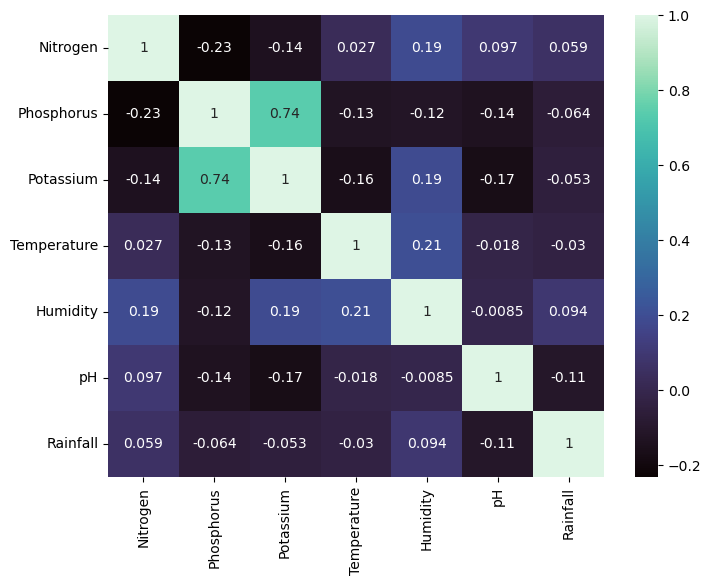

In [59]:
#Visualizing the correlation of variable
plt.figure(figsize=(8, 6))
cmap = sns.color_palette("mako", as_cmap=True)
sns.heatmap(data_1.corr(), annot=True, cmap=cmap)
plt.show()

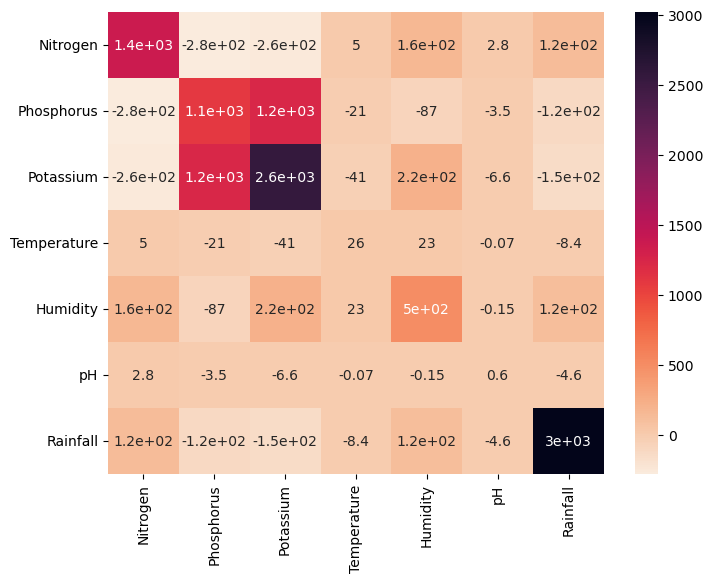

In [61]:
#Visualizing the correlation of variable
plt.figure(figsize=(8, 6))
cmap = sns.color_palette("rocket_r", as_cmap=True)
sns.heatmap(data_1.cov(), annot=True, cmap=cmap)
plt.show()

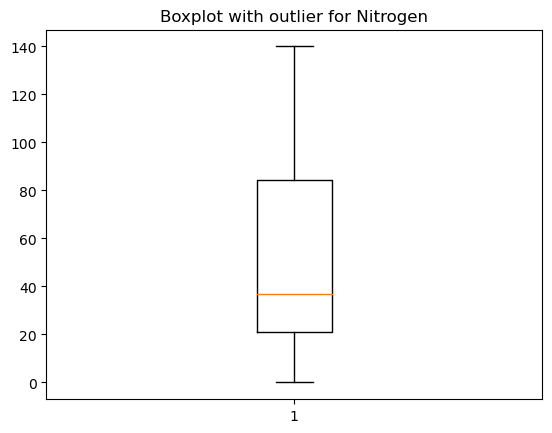

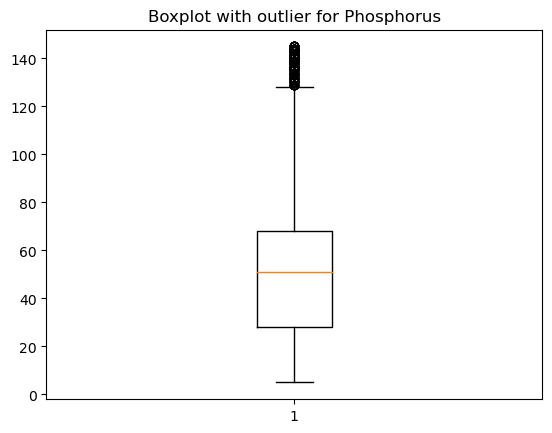

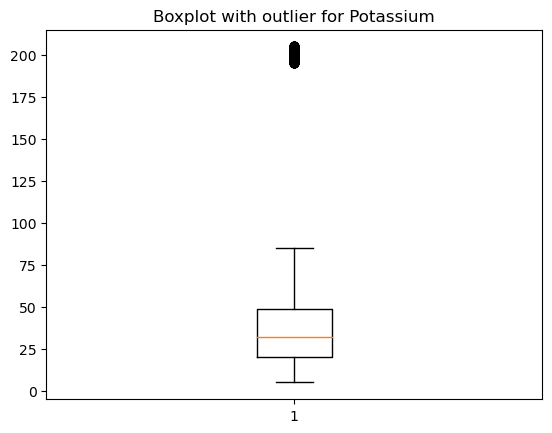

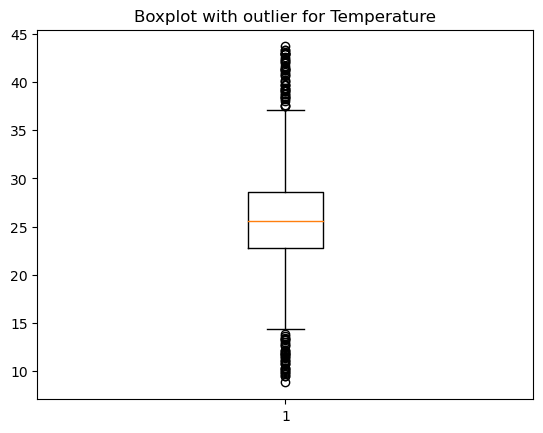

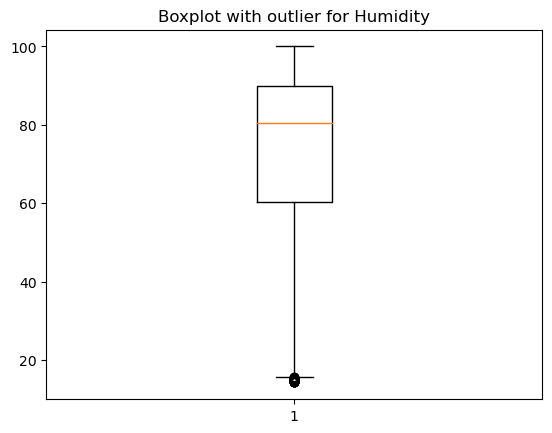

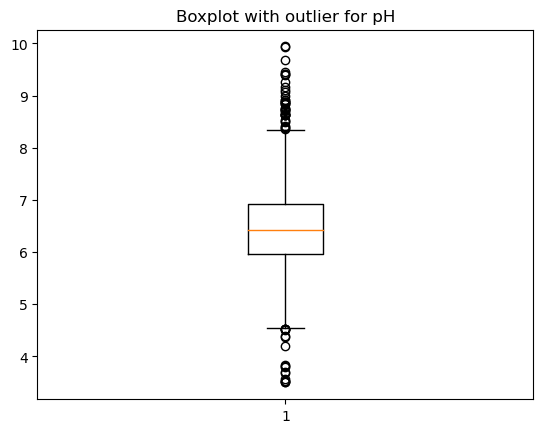

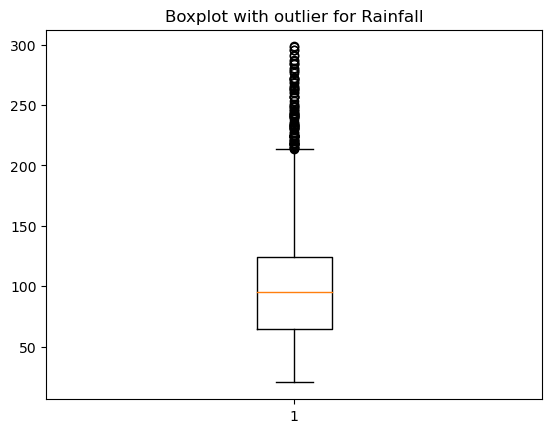

In [65]:
# Check for outliers in the variables using boxplot as individual in the dataset
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for column in data_columns:
    plt.boxplot(data_1[column])
    plt.title(f'Boxplot with outlier for {column}')
    plt.show()

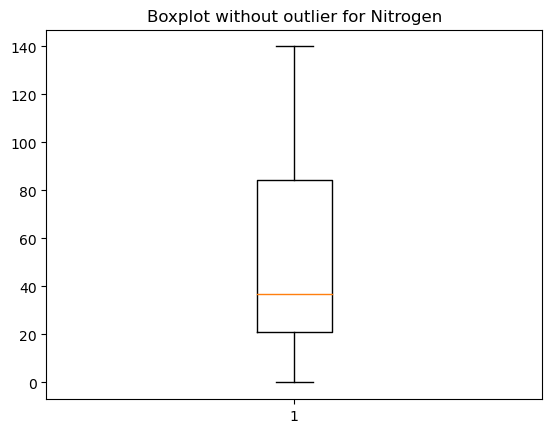

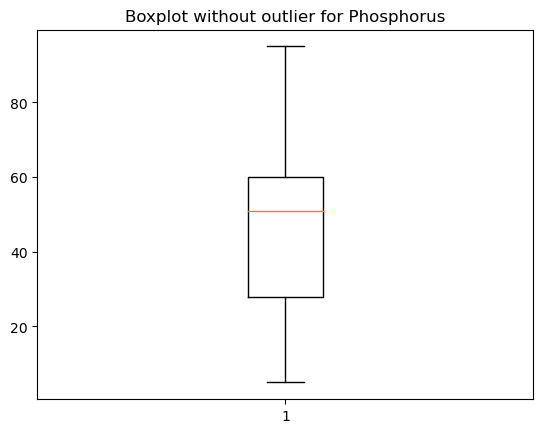

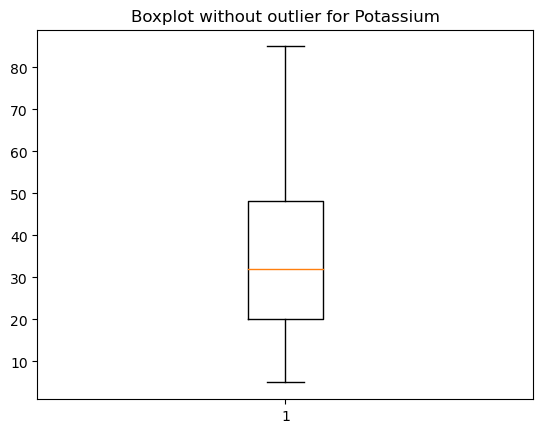

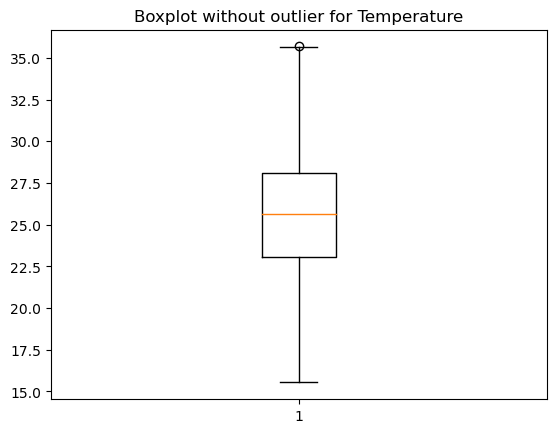

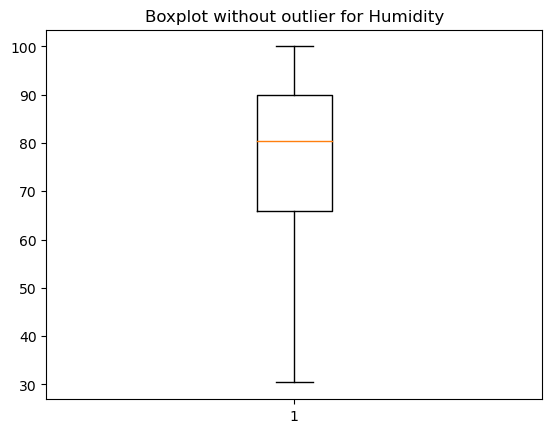

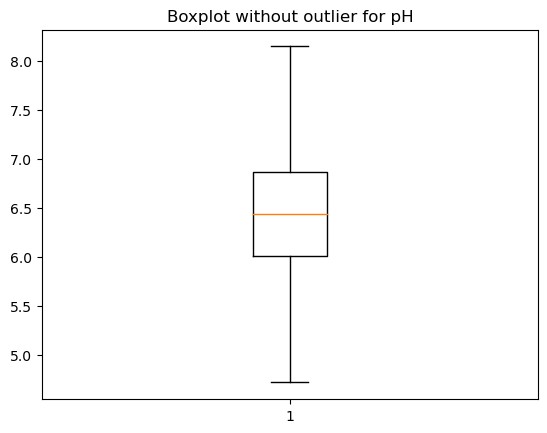

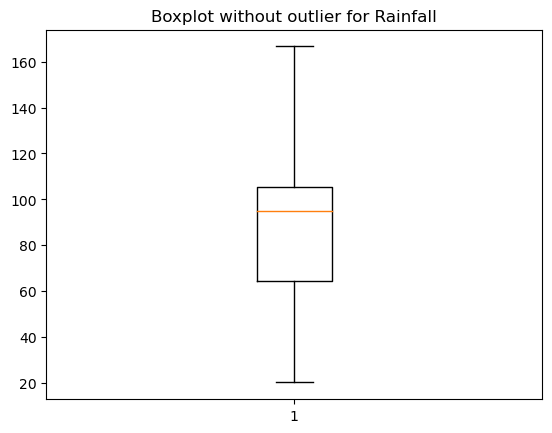

In [66]:
# Check for outliers in the variables using boxplot in the dataset
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for column in data_columns:
    plt.boxplot(data_2[column])
    plt.title(f'Boxplot without outlier for {column}')
    plt.show()

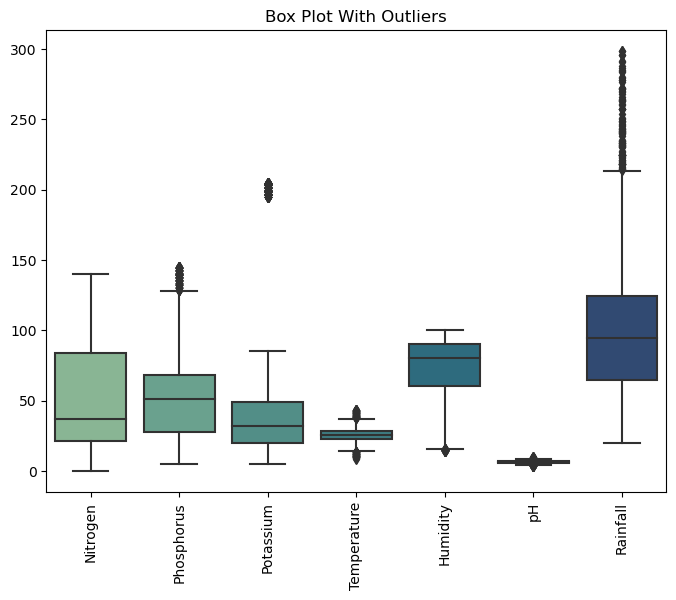

In [67]:
# Check for outliers in the variables using boxplot as a whole in the dataset
plt.figure(figsize=(8, 6))
sns.boxplot(data=data_1, orient="v", palette="crest")
plt.xticks(rotation = 90)
plt.title("Box Plot With Outliers")
plt.show()

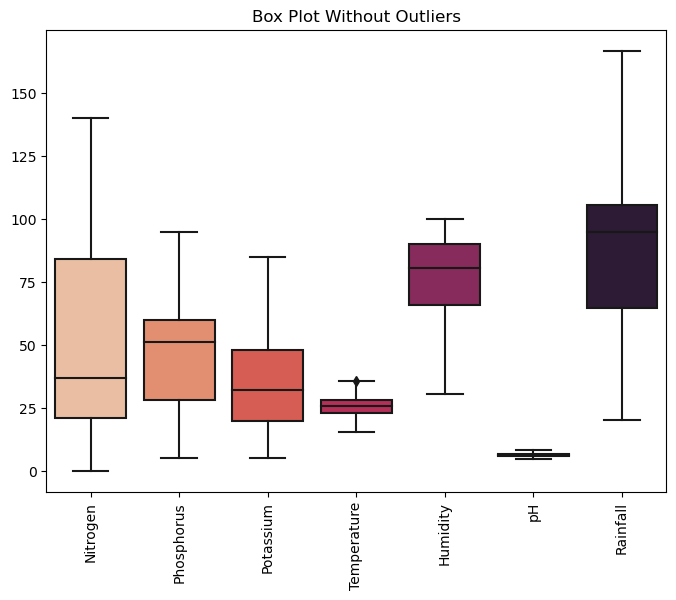

In [68]:
# Check for outliers in the variables using boxplot as a whole in the dataset
plt.figure(figsize=(8, 6))
sns.boxplot(data=data_2, orient="v", palette="rocket_r")
plt.xticks(rotation = 90)
plt.title("Box Plot Without Outliers")
plt.show()

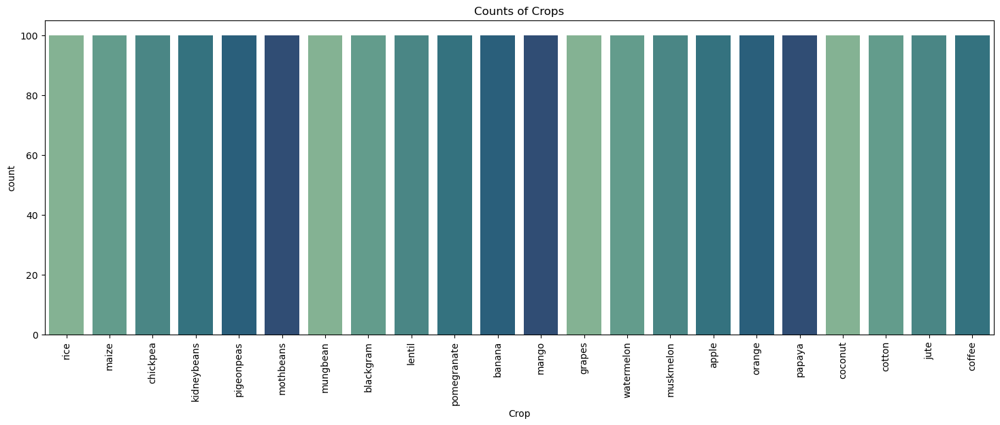

In [71]:
#Count of crops present in dataset using bar chart
plt.figure(figsize=(18, 6))
cmap = sns.color_palette("crest")
sns.countplot(x ="Crop", data = data_1, palette = cmap)
plt.xticks(rotation = 90)
plt.title("Counts of Crops")
plt.show()

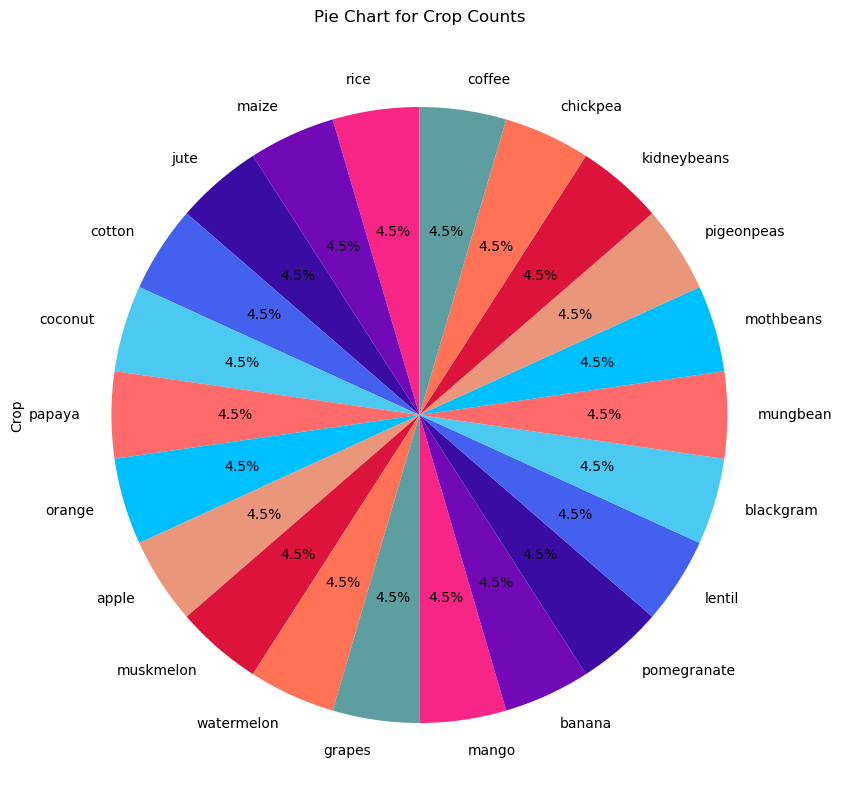

In [78]:
#Count of crops in data set using pie chart
counts = data_1['Crop'].value_counts()
plt.figure(figsize=(10, 10))
color = ["#F72585", "#7209B7", "#3A0CA3", "#4361EE", "#4CC9F0", "#FF6A6A", 
         "#00BFFF", "#E9967A", "#DC143C", "#FF7256", "#5F9EA0"]
counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors = color)
plt.title('Pie Chart for Crop Counts')
plt.show()

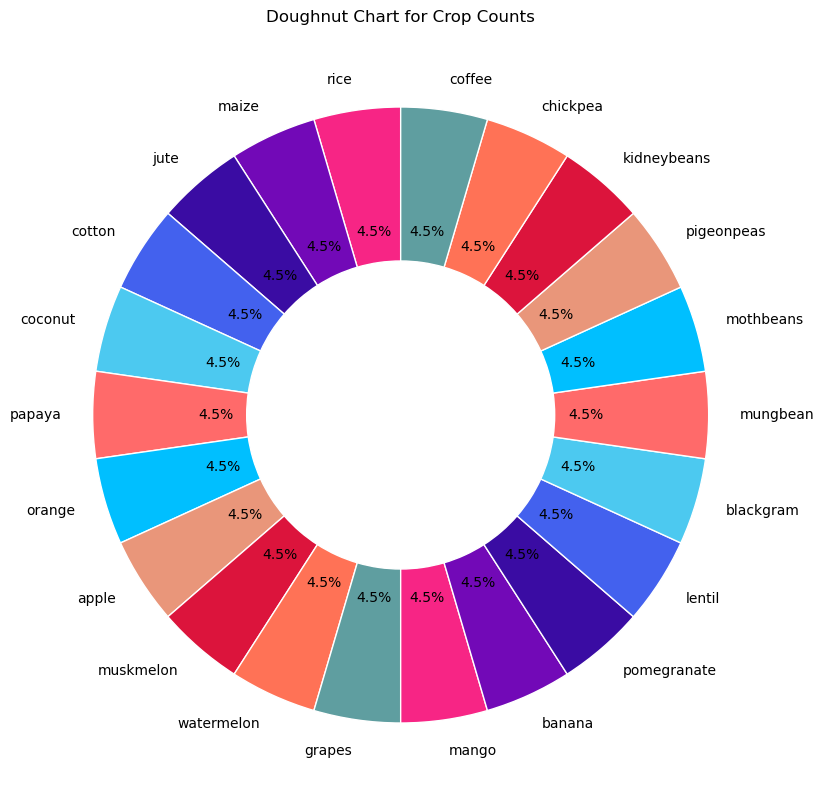

In [81]:
#Count of crops in data set using doughnut chart
counts = data_1['Crop'].value_counts()
fig, ax = plt.subplots(figsize=(10, 10))
color = ["#F72585", "#7209B7", "#3A0CA3", "#4361EE", "#4CC9F0", 
         "#FF6A6A", "#00BFFF", "#E9967A", "#DC143C", "#FF7256", "#5F9EA0"]
ax.pie(counts.values, labels=counts.index, autopct='%1.1f%%', 
       startangle=90, colors = color,
       wedgeprops={'width': 0.5, 'edgecolor': 'w'})
circle = plt.Circle((0, 0), 0.4, color='white')
fig.gca().add_artist(circle)
ax.set_title('Doughnut Chart for Crop Counts')
plt.show()

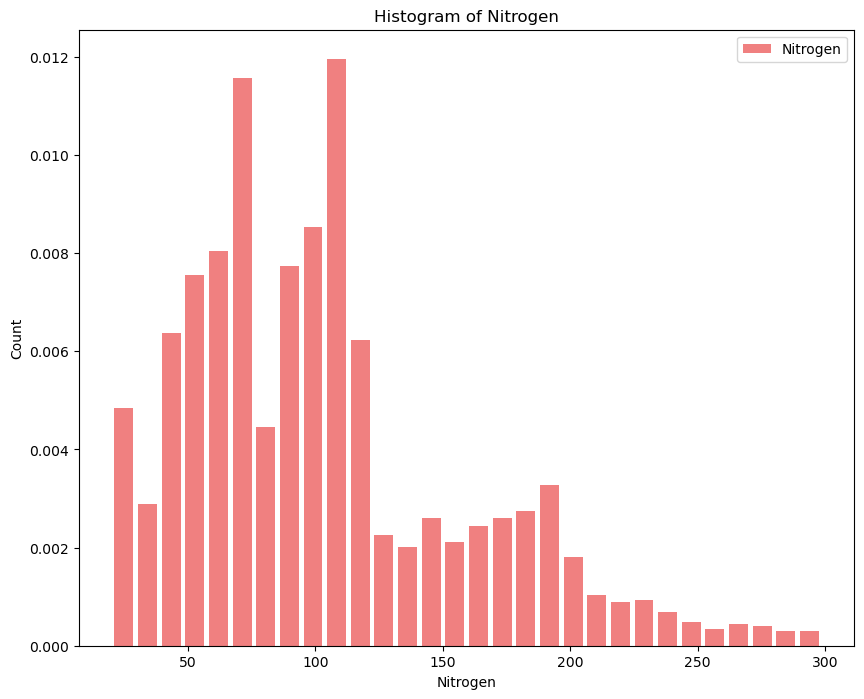

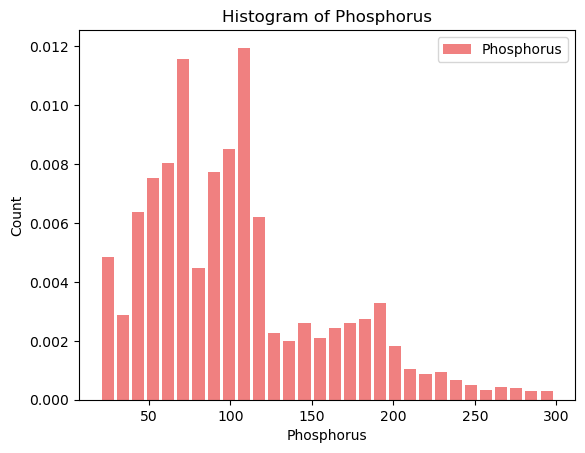

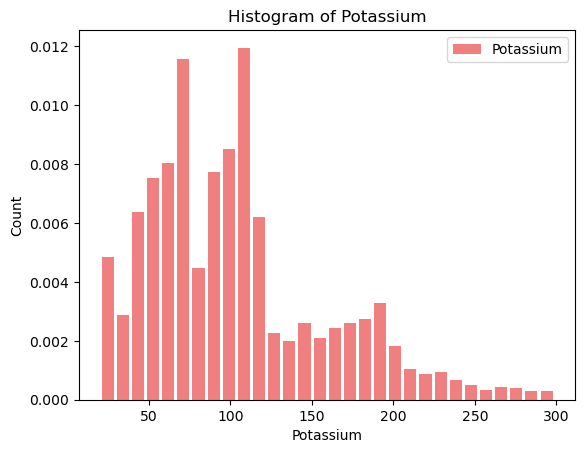

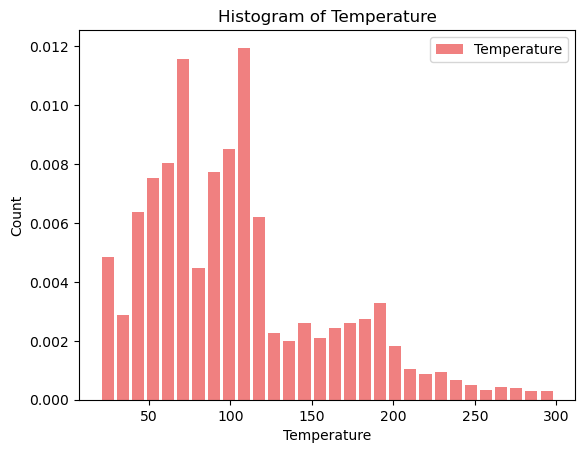

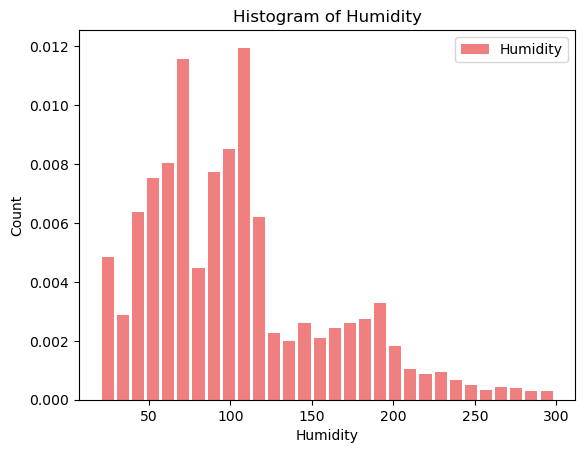

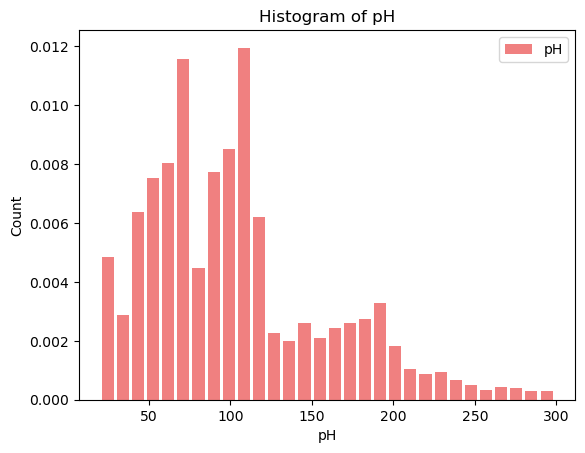

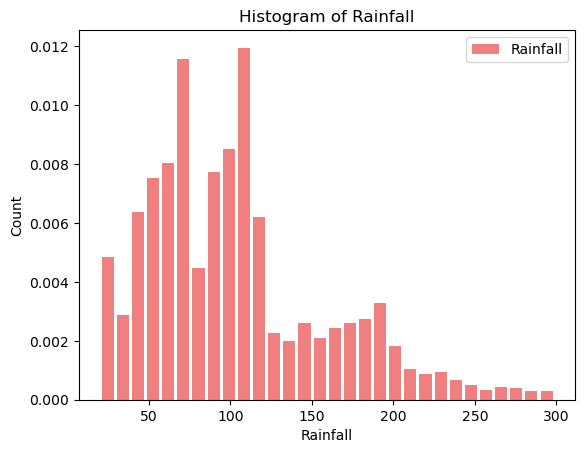

In [90]:
#Checking distribution using histogram with histtype = bar
x = data_1[column]
plt.figure(figsize=(10, 8))
colors = ["lightcoral"]
for column in data_1.columns[:-1]:
    plt.hist(x, bins = 30, density = True, histtype ='bar', color = colors, label = column, rwidth = 0.8)
    plt.legend(prop ={'size': 10})
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

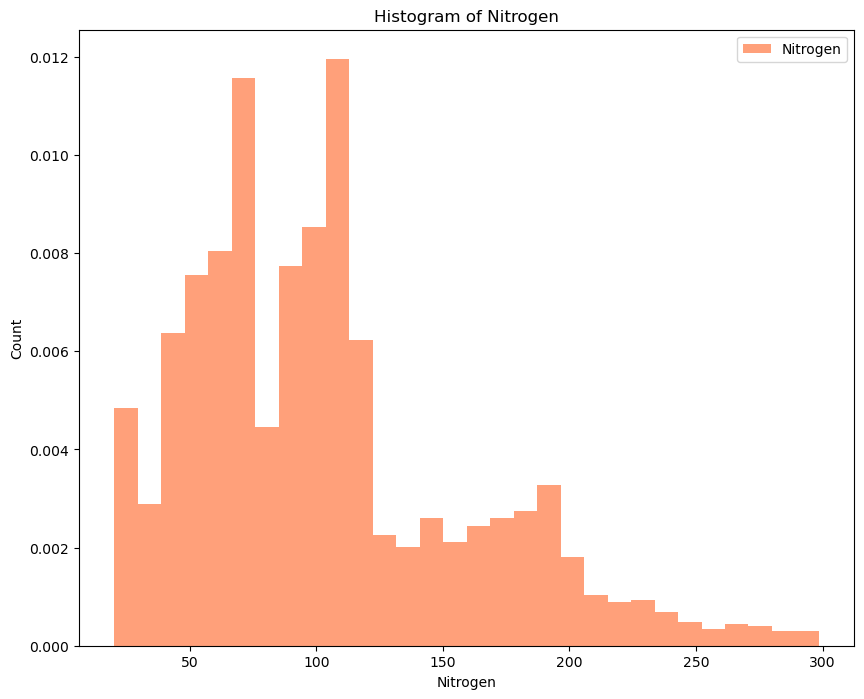

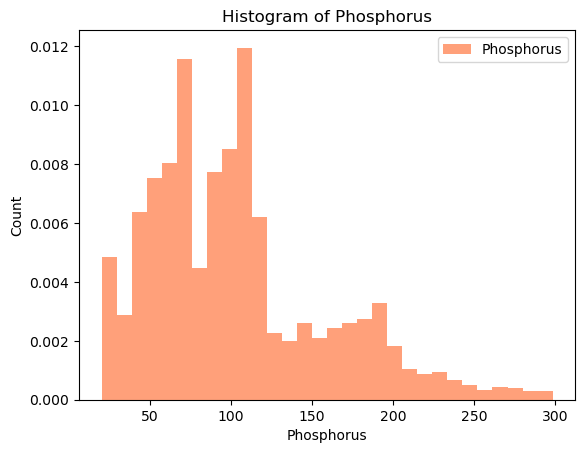

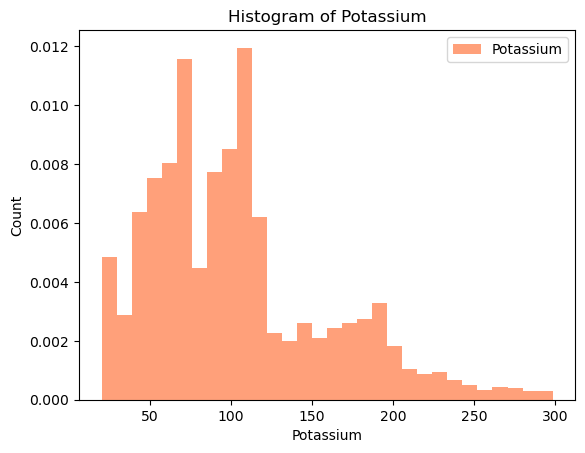

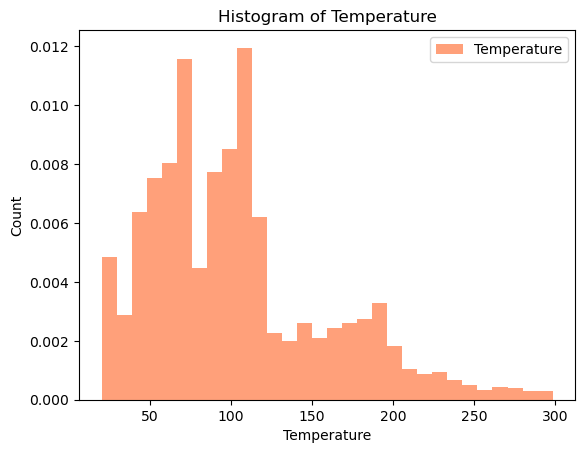

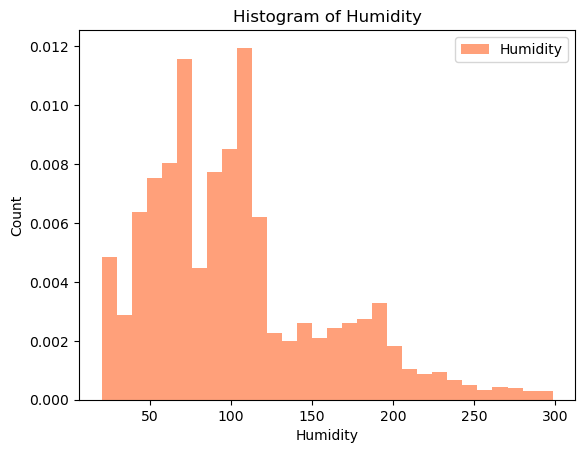

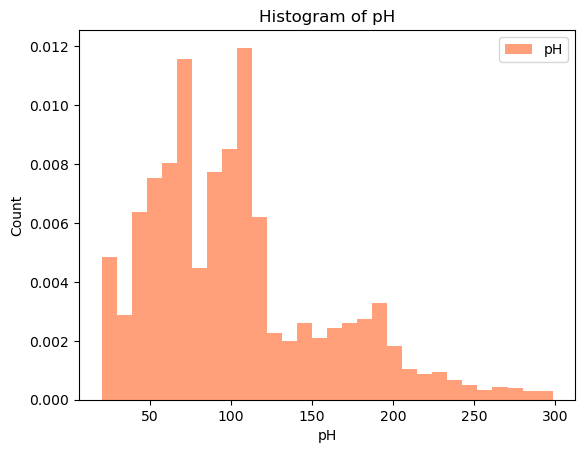

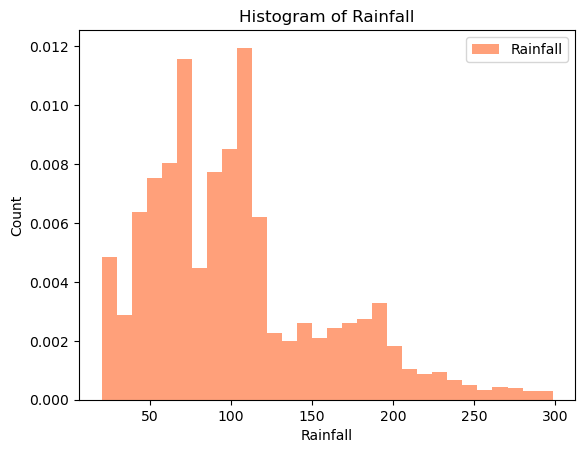

In [93]:
#Checking distribution using histogram with histtype = stepfilled
x = data_1[column]
plt.figure(figsize=(10, 8))
colors = ["lightsalmon"]
for column in data_1.columns[:-1]:
    plt.hist(x, bins = 30, density = True, histtype ='stepfilled', color = colors, label = column, rwidth = 0.8)
    plt.legend(prop ={'size': 10})
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.show()

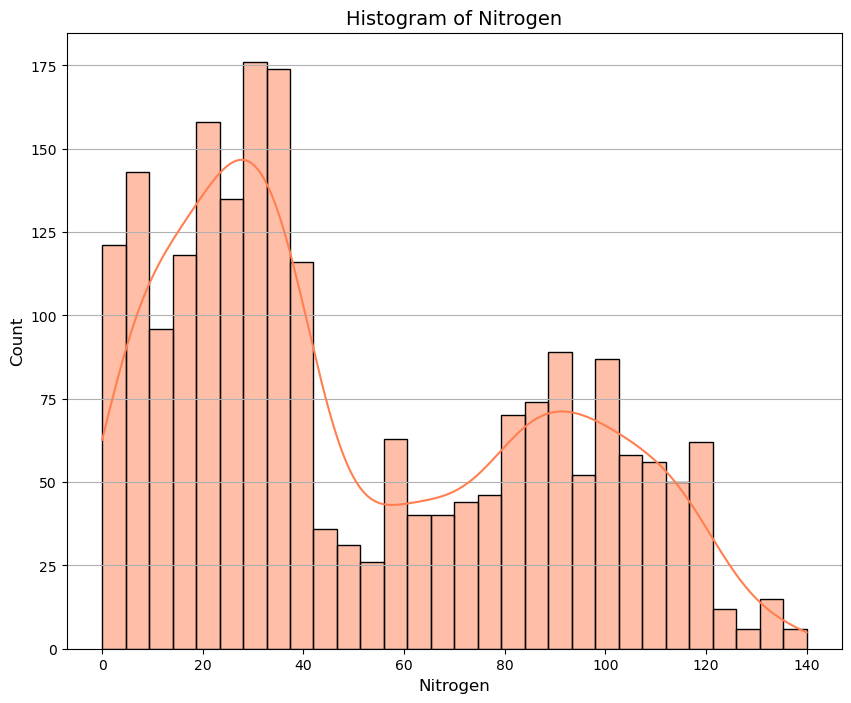

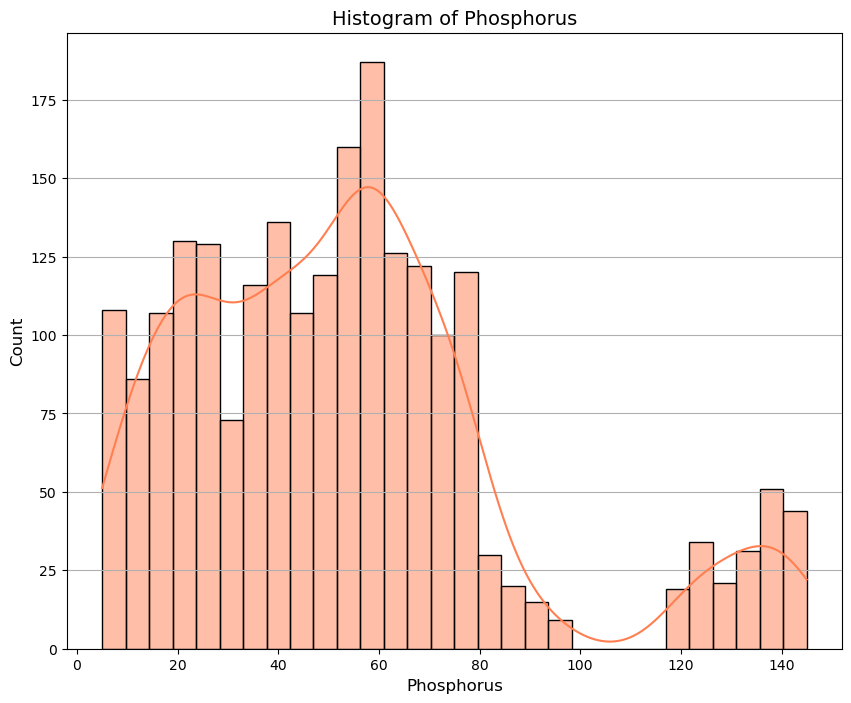

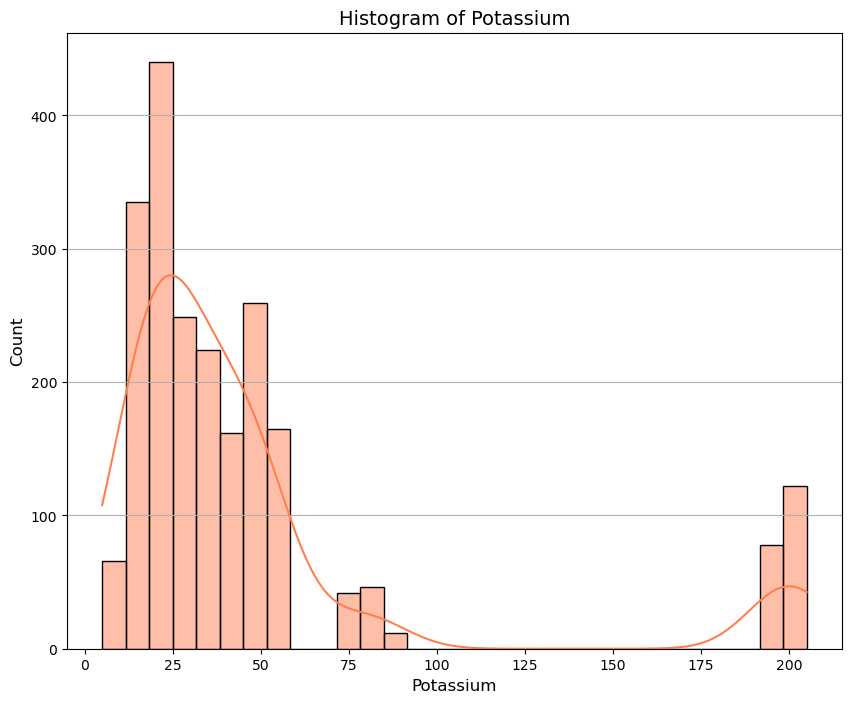

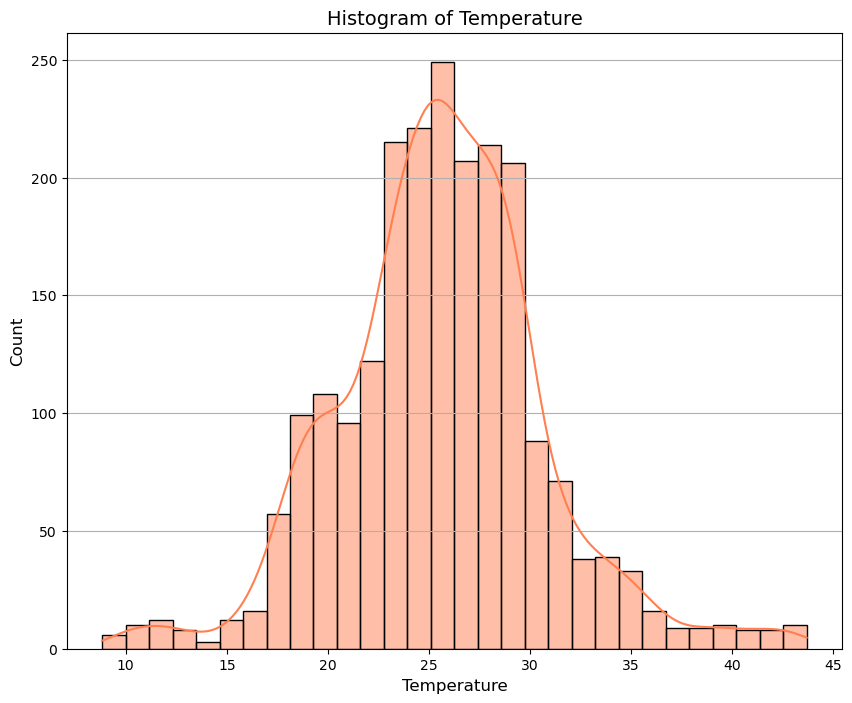

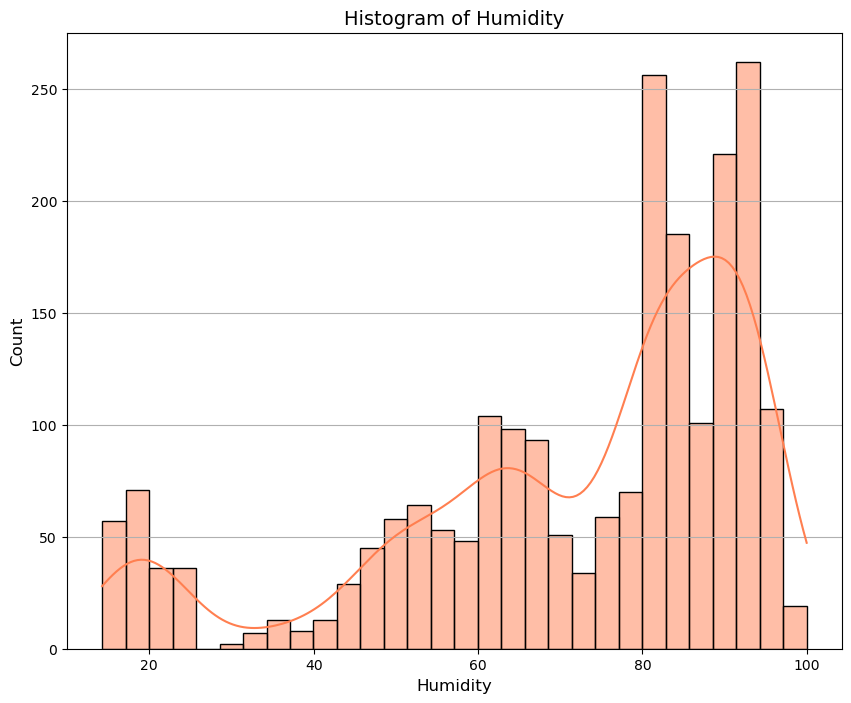

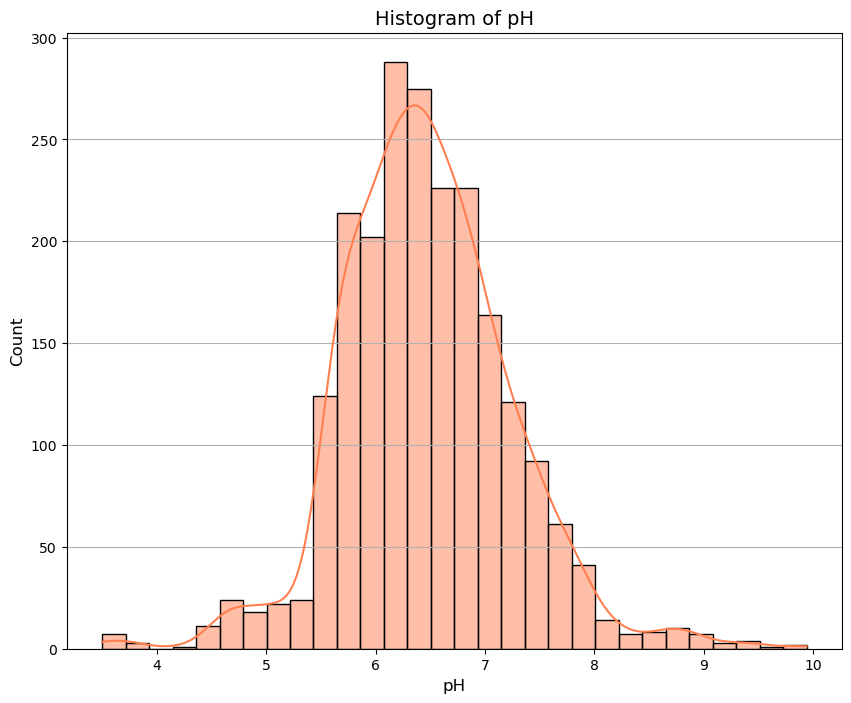

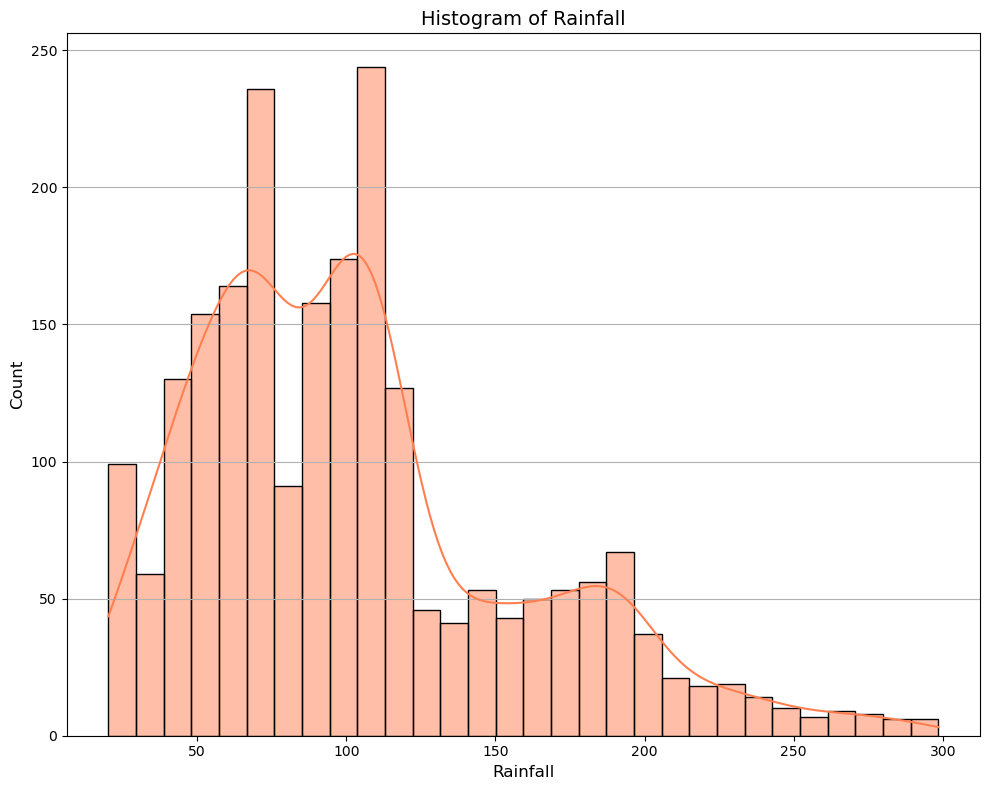

In [97]:
#Checking distribution using histogram with curve
colors = ["coral"]
for column in data_1.columns[:-1]:
    plt.figure(figsize=(10, 8))
    sns.histplot(data=data_1, x=column, bins=30, kde=True, color=colors)
    plt.xlabel(column, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title(f'Histogram of {column}', fontsize=14)
    plt.grid(axis='y')

plt.tight_layout()
plt.show()

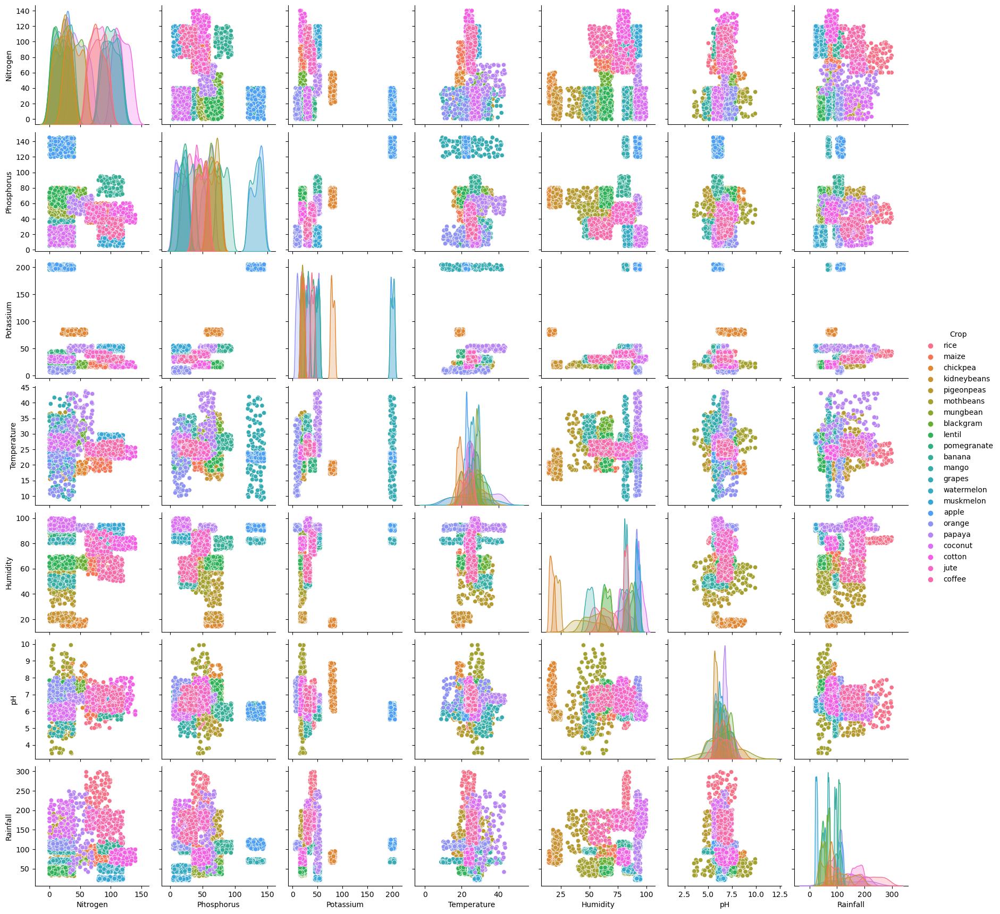

In [102]:
#Visualization using pair plot
hue_variable = "Crop"
sns.pairplot(data_1, hue = hue_variable)
plt.show()

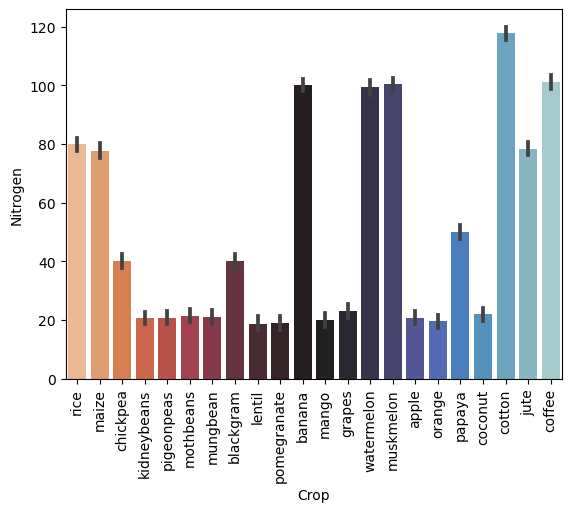

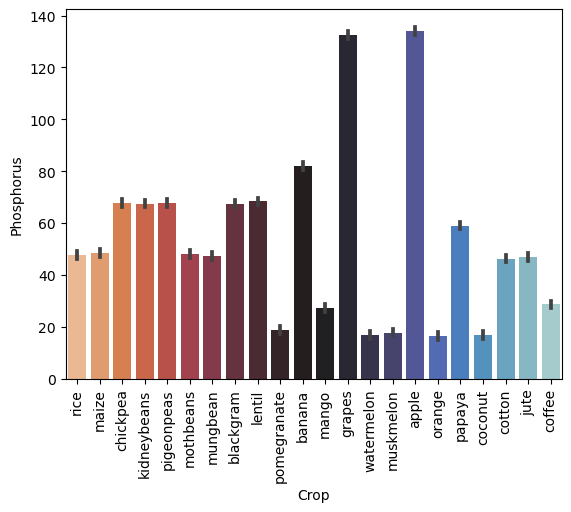

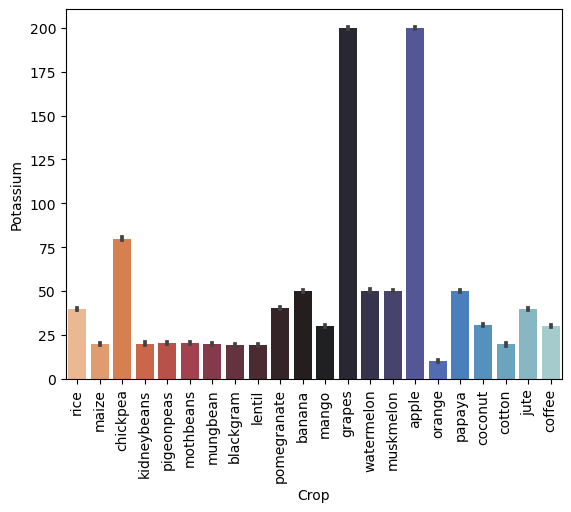

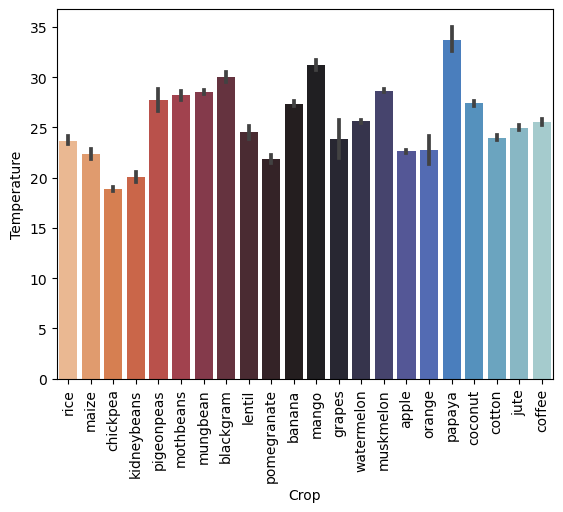

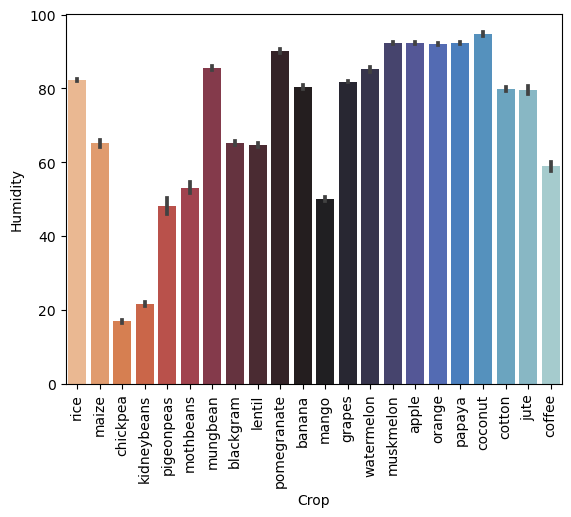

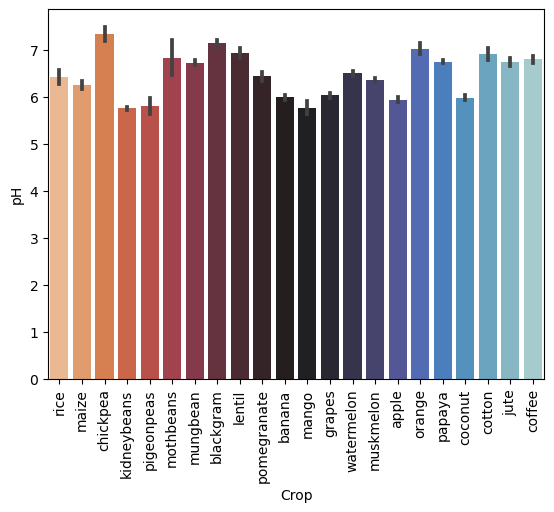

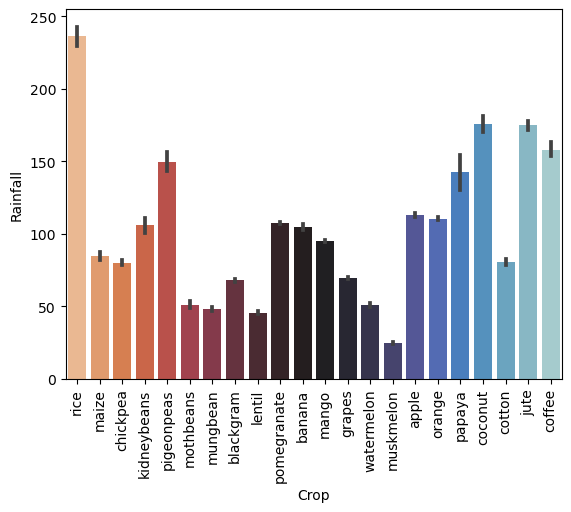

In [103]:
#Visualization using Bar Chart (1)
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_columns:
    sns.barplot(x = 'Crop',y = i , data = data_1, palette = "icefire_r")
    plt.xticks(rotation = 90)
    plt.show()


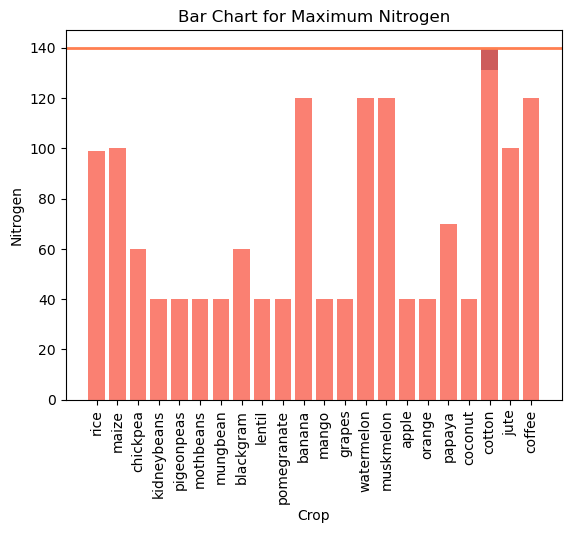

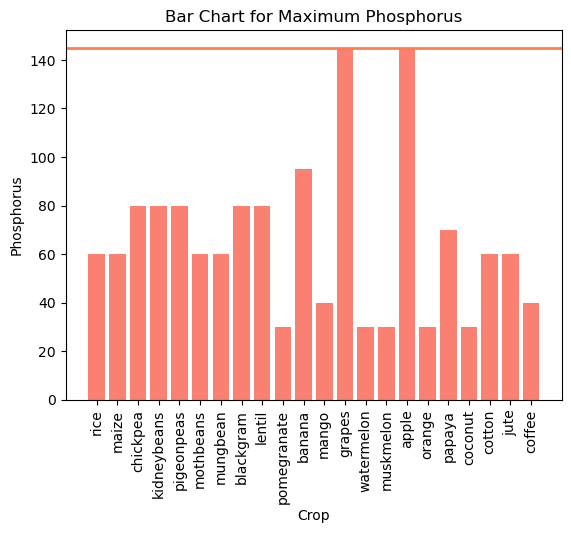

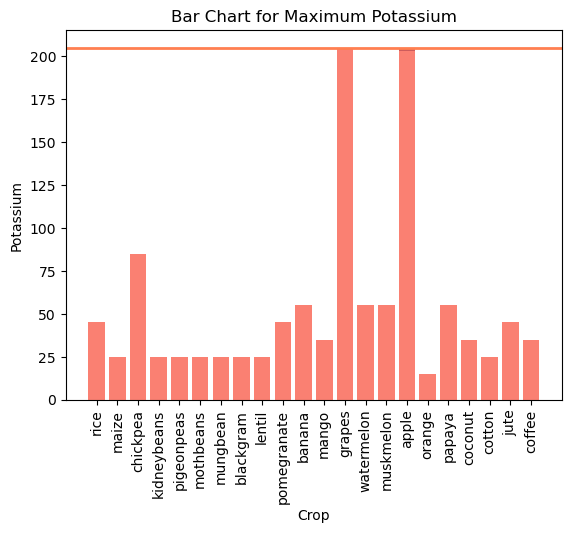

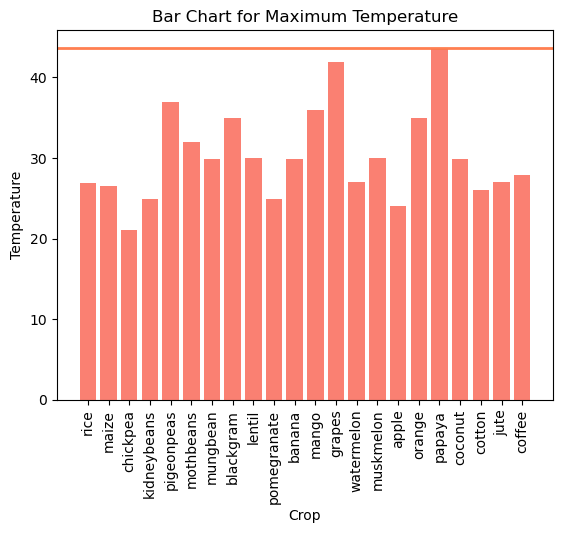

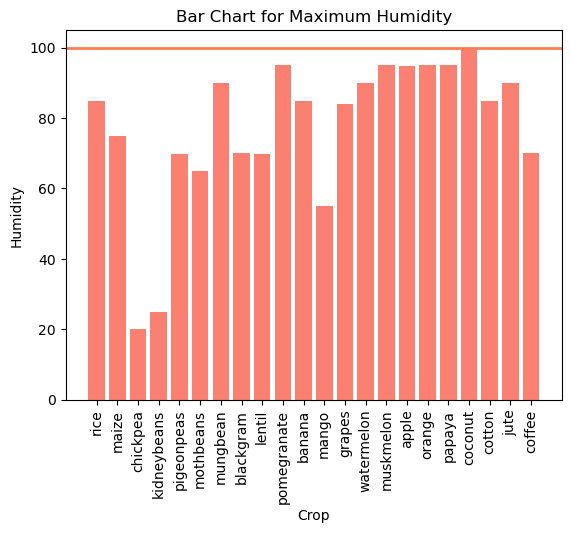

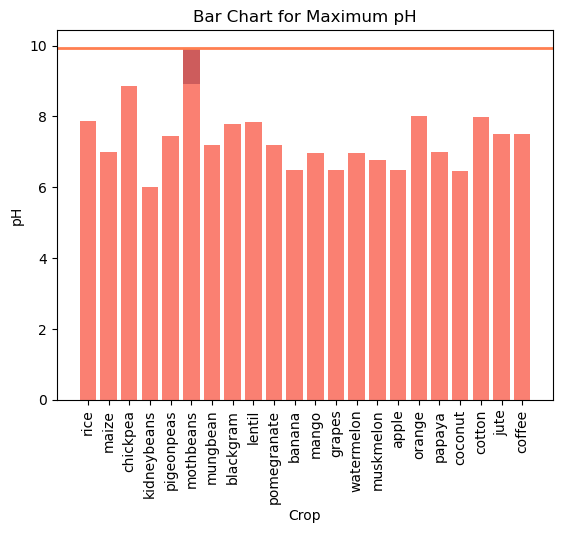

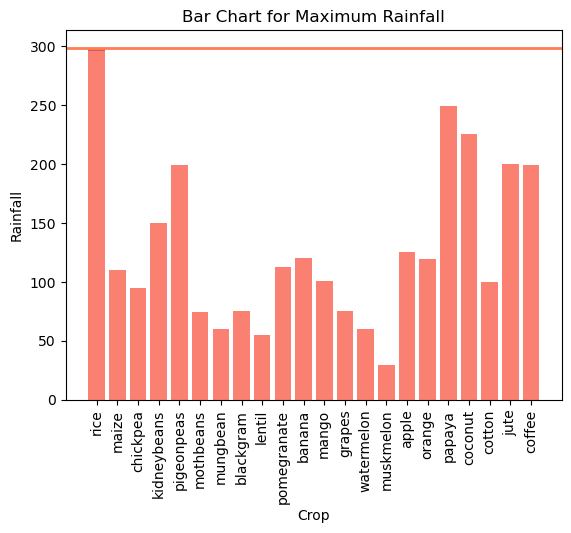

In [6]:
#Visualization using Bar Chart (2)
#Calculate the maximum value using Bar Chart
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature','Humidity', 'pH', 'Rainfall']
for var in data_columns:
    maximum = data_1[var].max()
    plt.bar(data_1['Crop'], data_1[var], color=['indianred' if val == maximum else 'salmon' for val in data_1[var]])
    plt.axhline(maximum, color='coral', linewidth=2)
    plt.title(f'Bar Chart for Maximum {var}')
    plt.xlabel('Crop')
    plt.ylabel(var)
    plt.xticks(rotation = 90)
    plt.show()

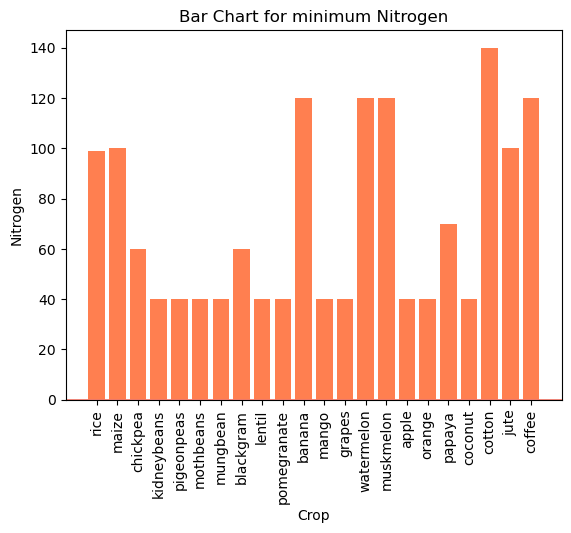

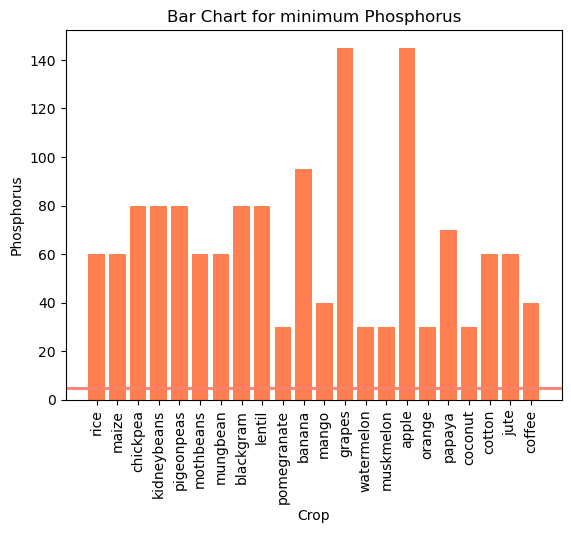

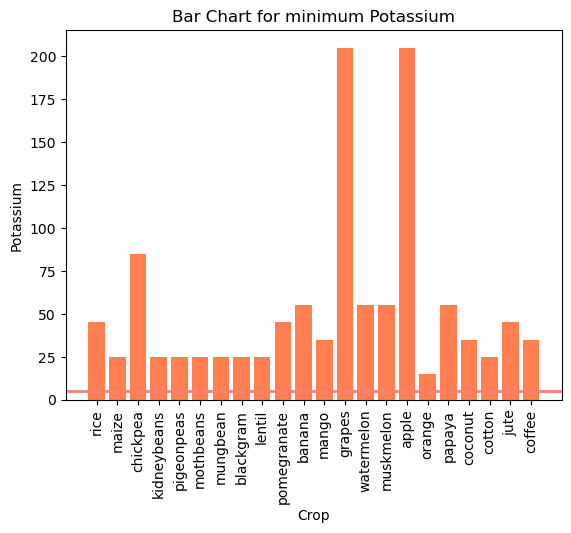

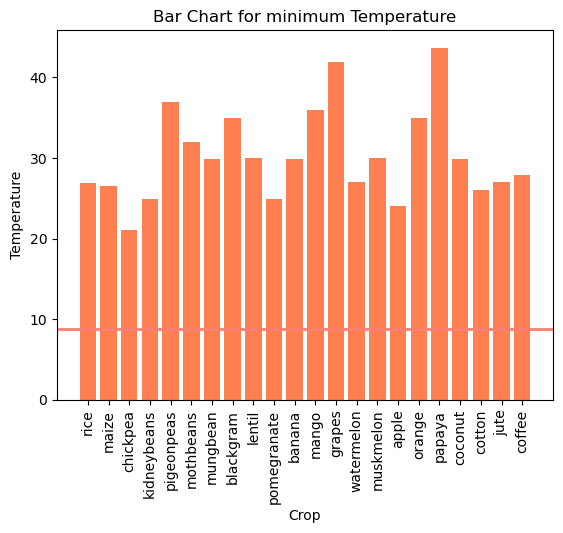

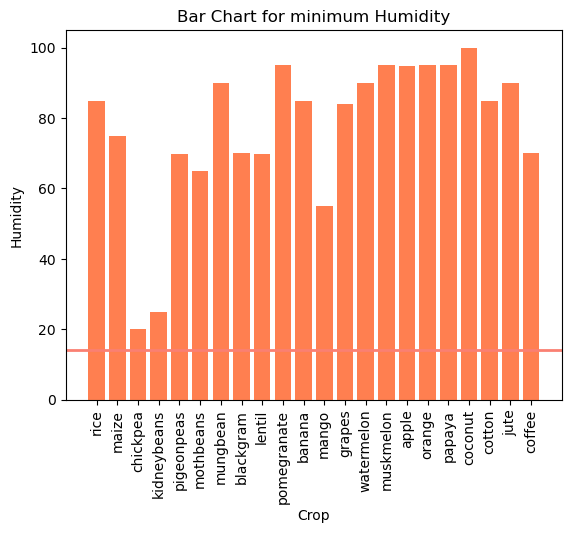

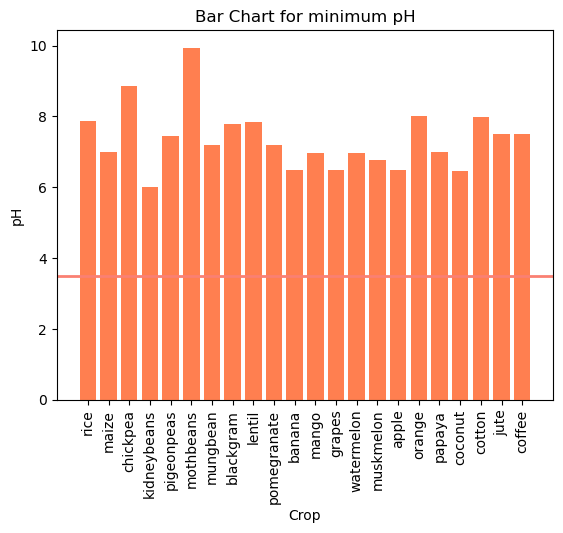

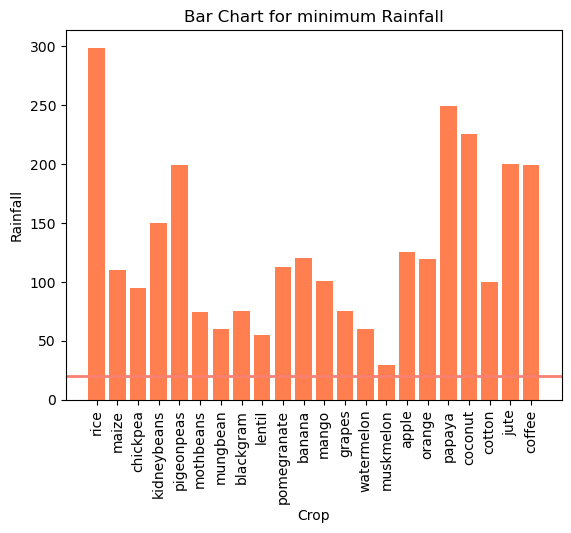

In [22]:
#Visualization using Bar Chart (2)
#Calculate the minimum value using Bar Chart 
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature','Humidity', 'pH', 'Rainfall']
for var in data_columns:
    minimum = data_1[var].min()
    plt.bar(data_1['Crop'], data_1[var], color=['indianred' if val == minimum else 'coral' for val in data_1[var]])
    plt.axhline(minimum, color='salmon', linewidth=2)
    plt.title(f'Bar Chart for minimum {var}')
    plt.xlabel('Crop')
    plt.ylabel(var)
    plt.xticks(rotation = 90)
    plt.show()
    

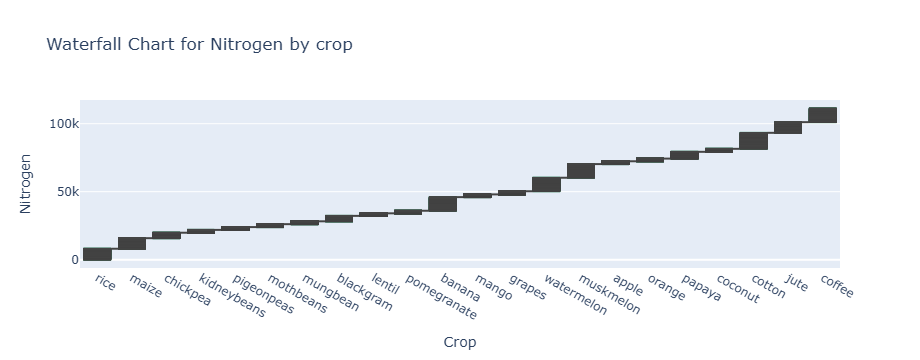

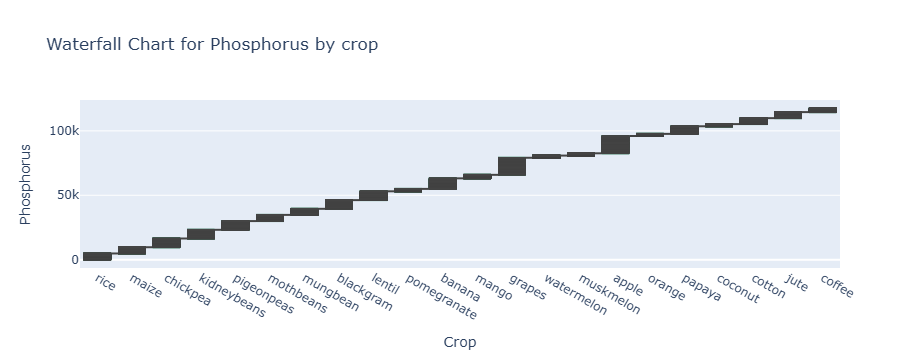

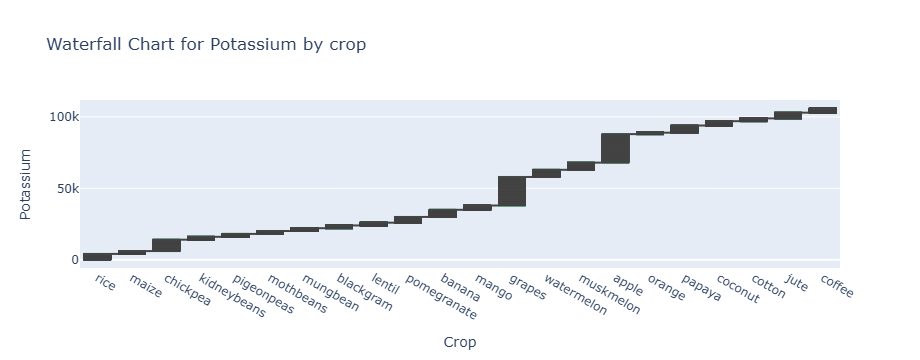

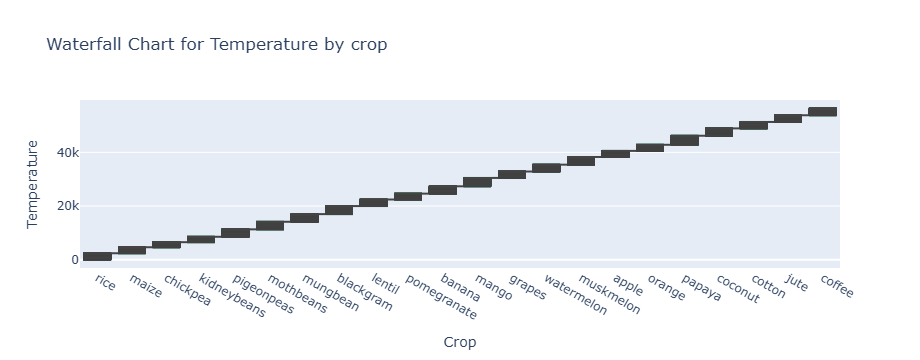

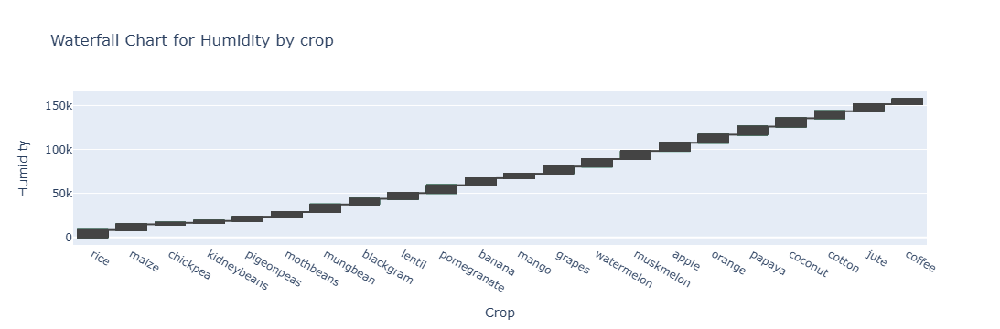

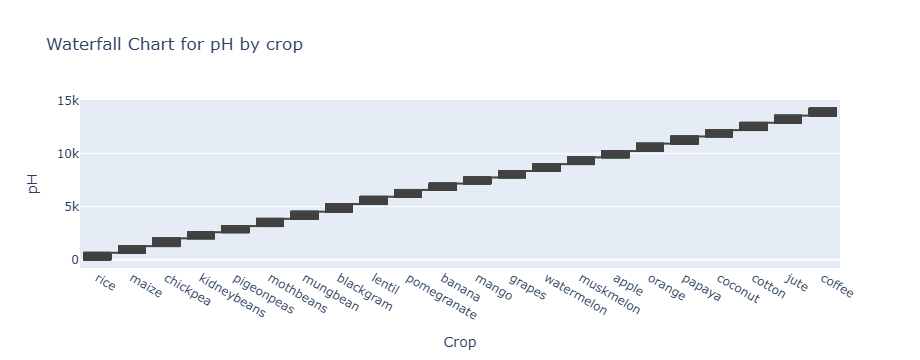

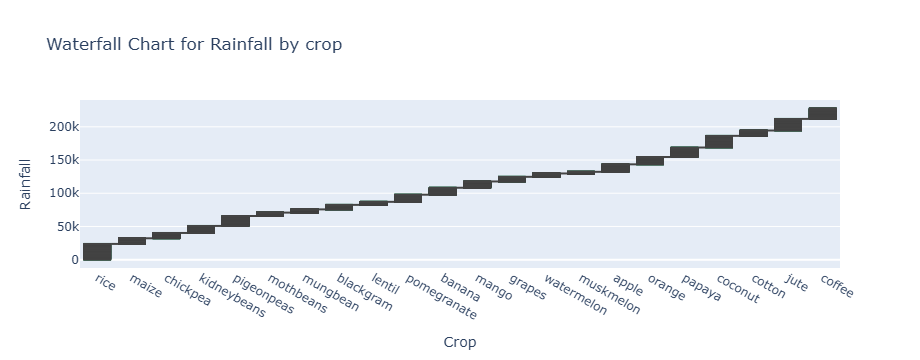

In [8]:
#Visualization using Waterfall Chart (1)
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_columns:
    x = data_1["Crop"]
    y = data_1[i]
    mean = data_1[i].mean()
    trace = go.Waterfall(x = x, y = y, base = mean, textposition = 'outside',)
    layout = go.Layout(title = f'Waterfall Chart for {i} by crop', xaxis = dict(title='Crop'),
                       yaxis = dict(title=i),)
    fig = go.Figure(data=[trace], layout=layout)
    fig.show()

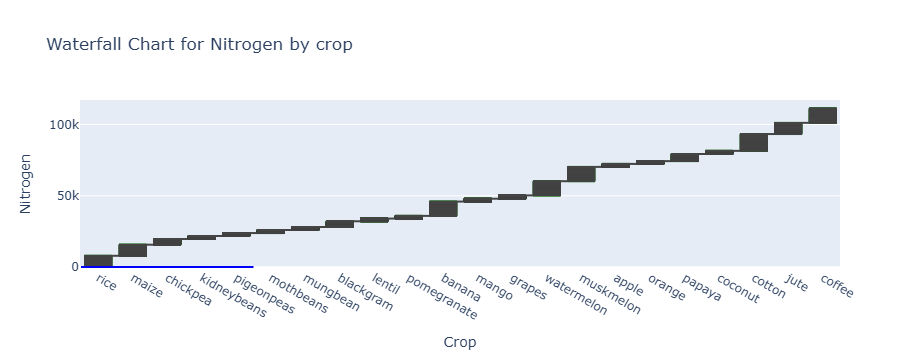

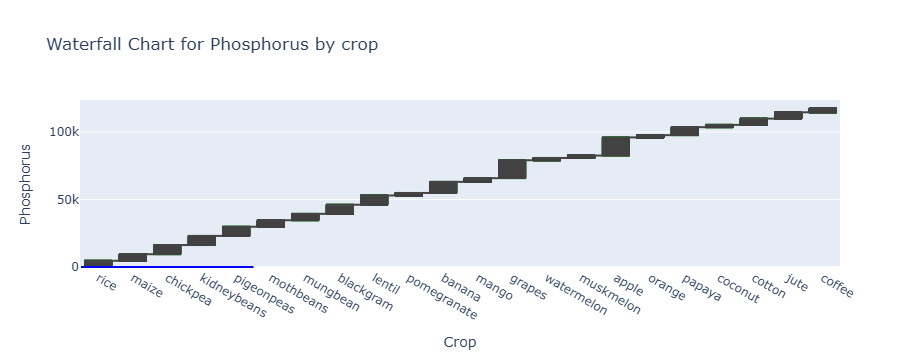

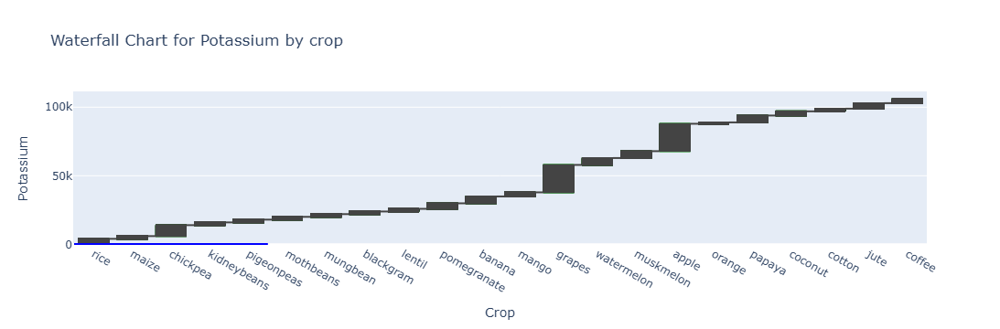

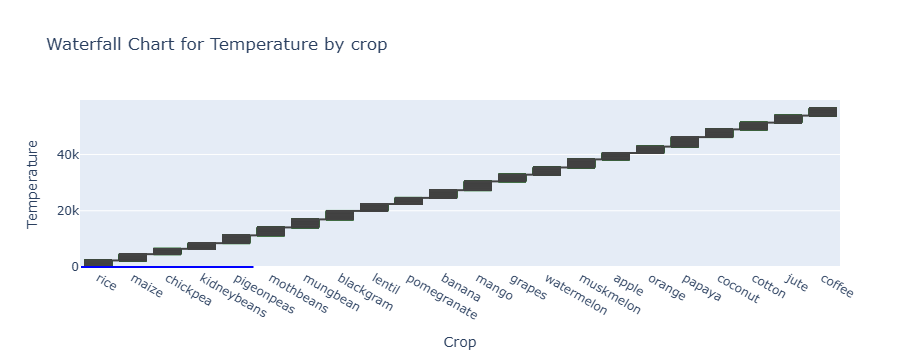

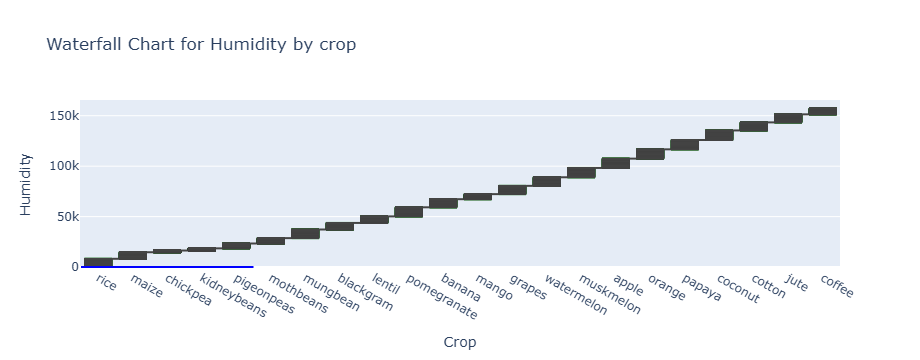

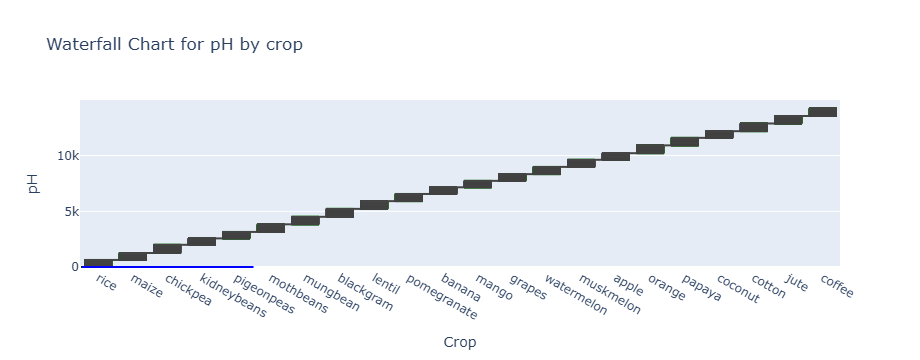

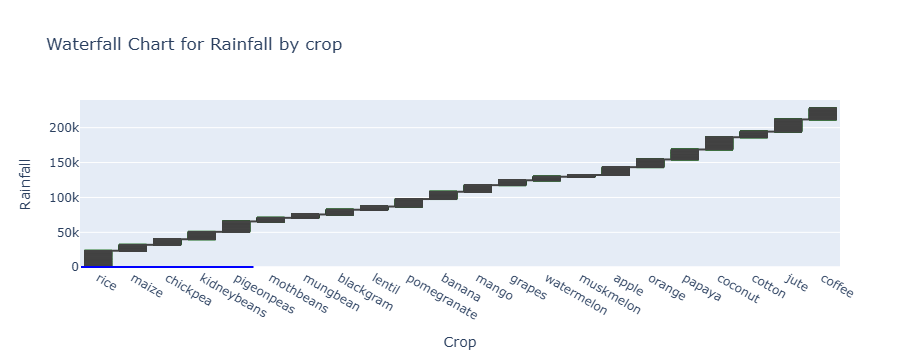

In [9]:
#Visualization using Waterfall Chart (2)
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_columns:
    x = data_1["Crop"]
    y = data_1[i]
    maximum = data_1[i].max()
    trace = go.Waterfall(x = x,y = y,base = 0,textposition = 'outside',increasing = dict(marker=dict(color='green')),
                         decreasing = dict(marker=dict(color='red')),)
    layout = go.Layout(title = f'Waterfall Chart for {i} by crop', xaxis = dict(title='Crop'), 
                       yaxis = dict(title=i))
    layout.update({'shapes': [{'type': 'line','x0': -0.5, 'y0': maximum,'x1': 4.5,'y1': maximum,
                               'line': dict(color='blue', width=2)}]})
    fig = go.Figure(data=[trace], layout=layout)
    fig.show()

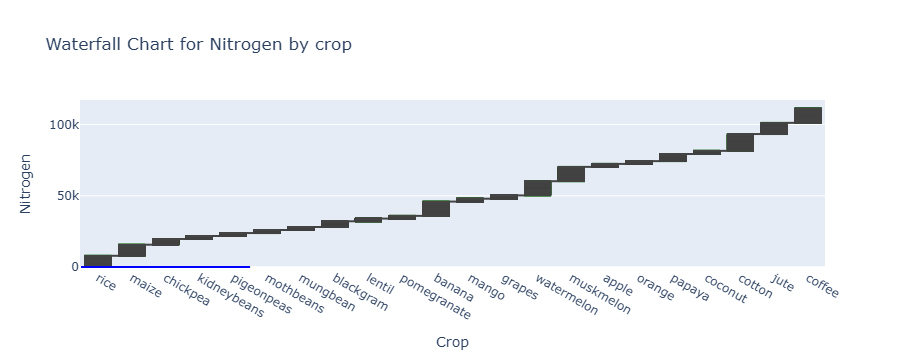

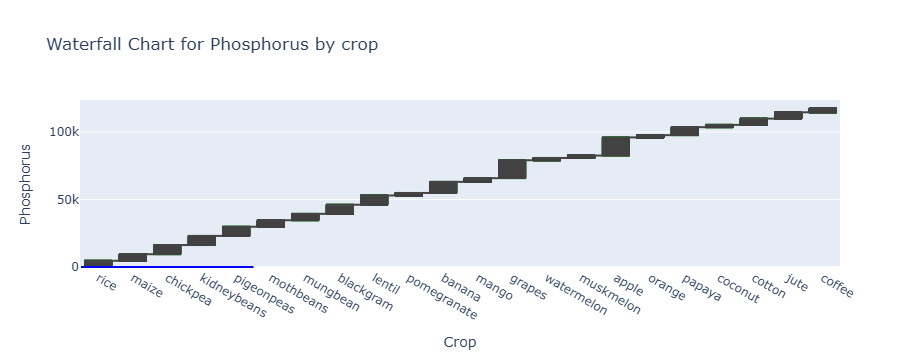

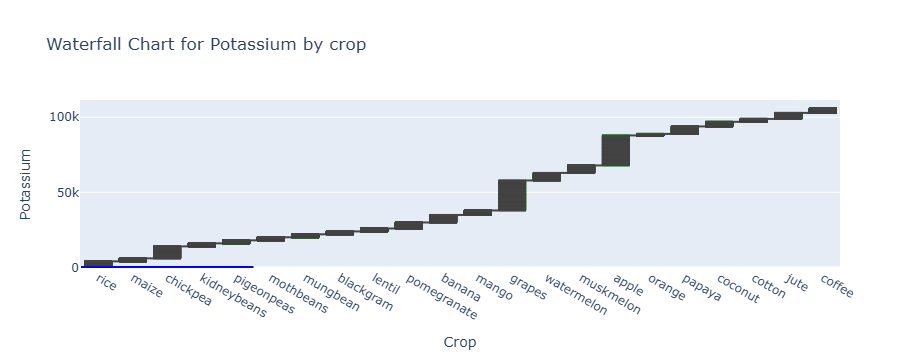

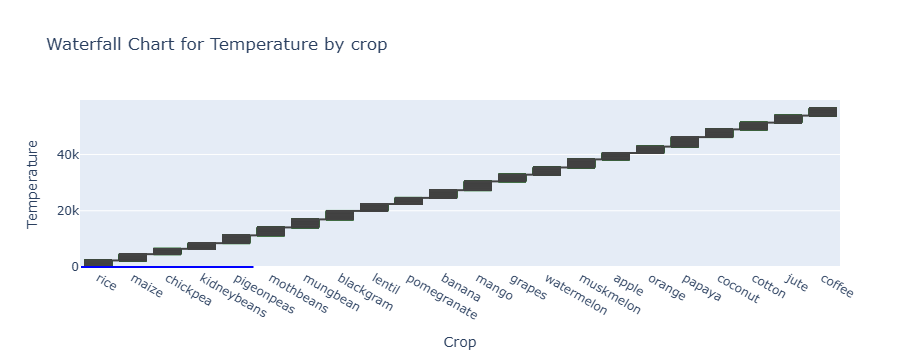

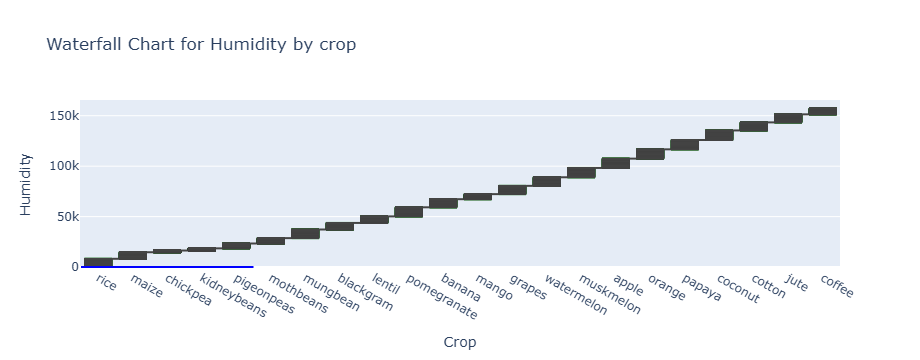

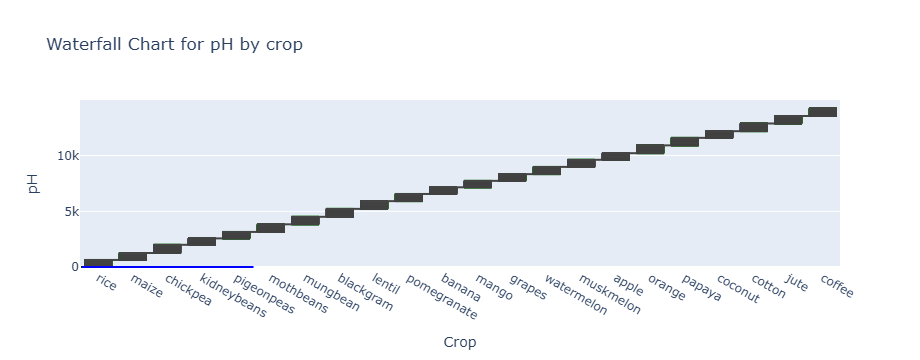

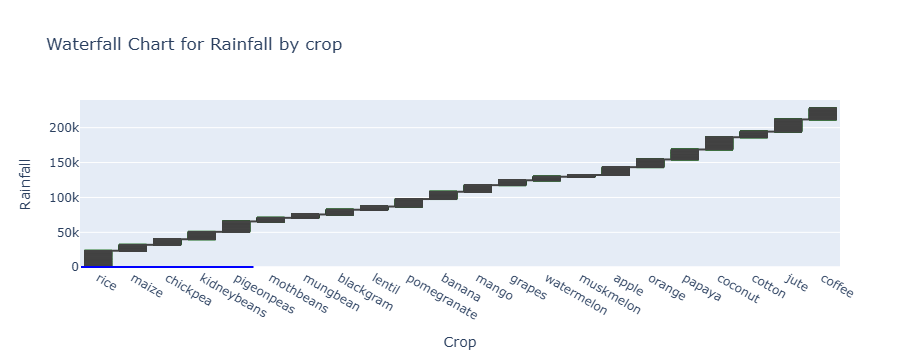

In [10]:
#Visualization using Waterfall Chart (3)
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_columns:
    x = data_1["Crop"]
    y = data_1[i]
    minimum = data_1[i].max()
    trace = go.Waterfall(x = x,y = y,base = 0,textposition='outside',increasing=dict(marker=dict(color='green')),
                         decreasing=dict(marker=dict(color='red')),)
    layout = go.Layout(title = f'Waterfall Chart for {i} by crop',xaxis = dict(title='Crop'),
                       yaxis = dict(title = i),)
    layout.update({'shapes': [{'type': 'line','x0': -0.5,'y0': minimum,'x1': 4.5,'y1': minimum,
                               'line': dict(color='blue', width=2)}]})
    fig = go.Figure(data=[trace], layout=layout)
    fig.show()

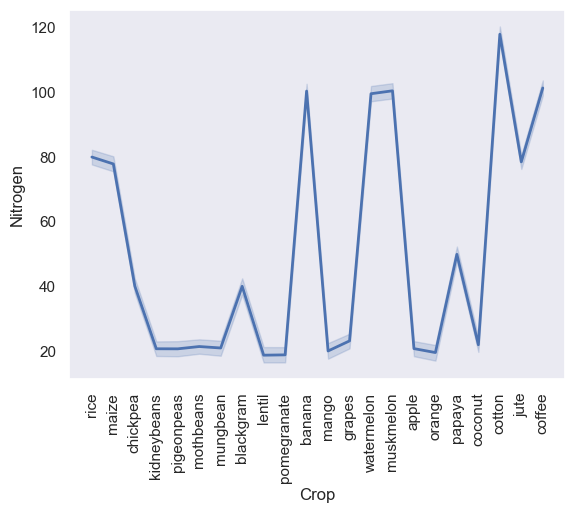

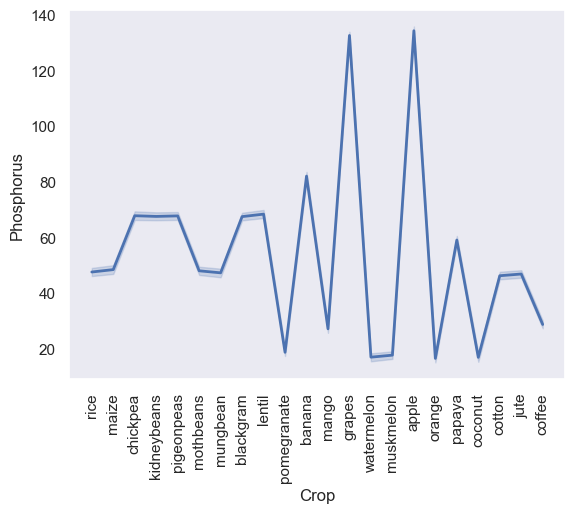

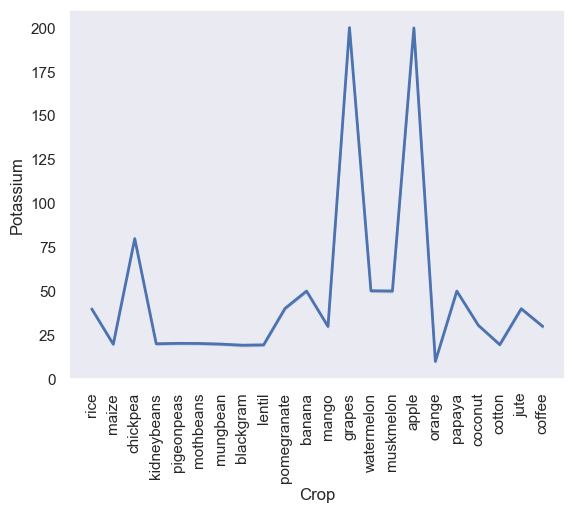

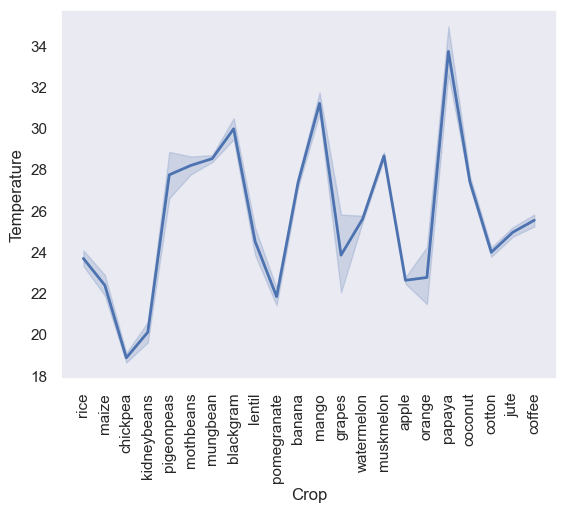

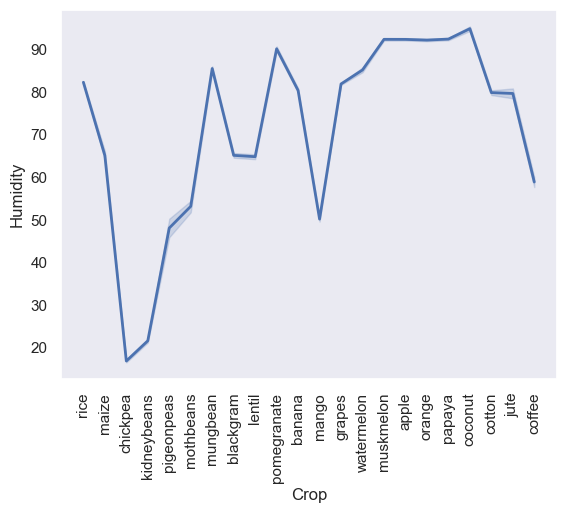

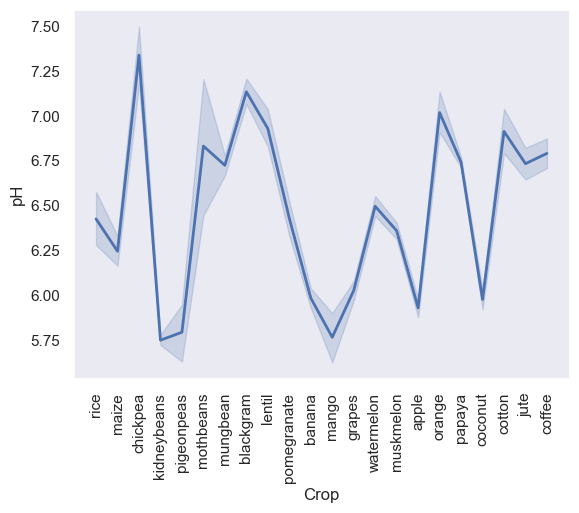

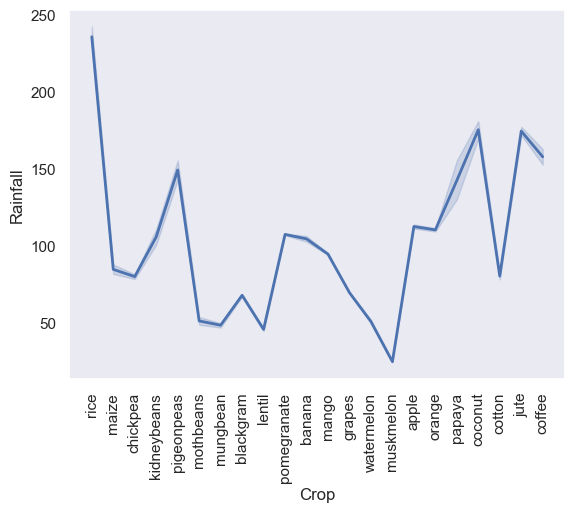

In [118]:
#Visualization using Line Chart
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_columns:
    sns.lineplot(x = 'Crop', y = i, data = data_1, linewidth = 2)
    plt.xticks(rotation = 90)
    plt.grid(False)
    plt.show()

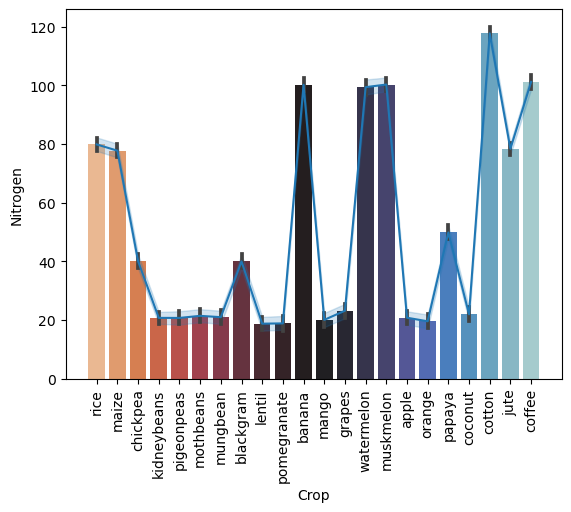

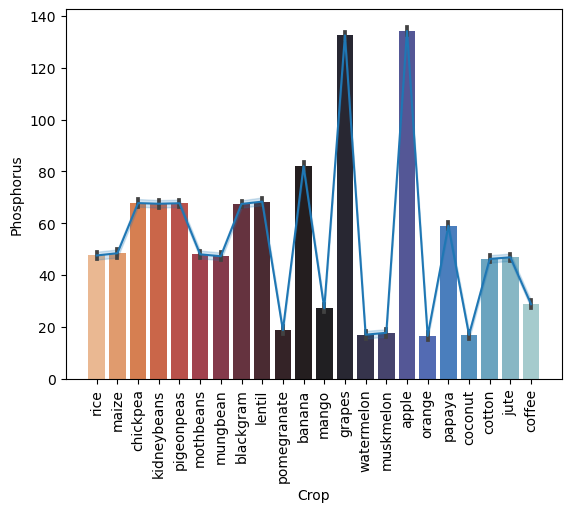

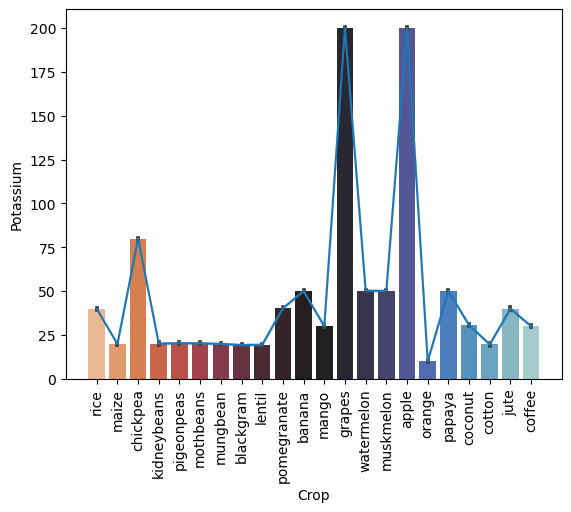

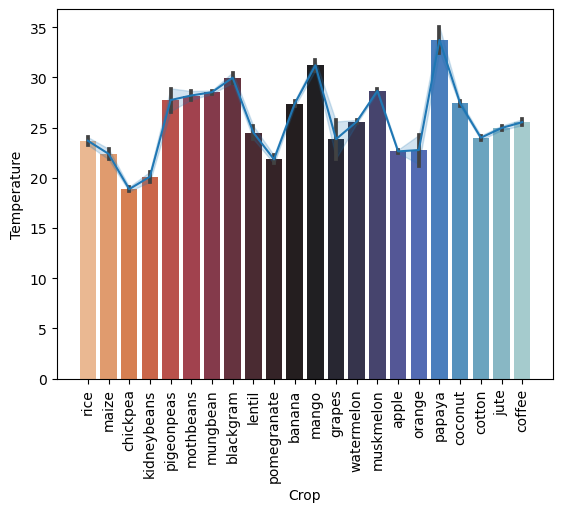

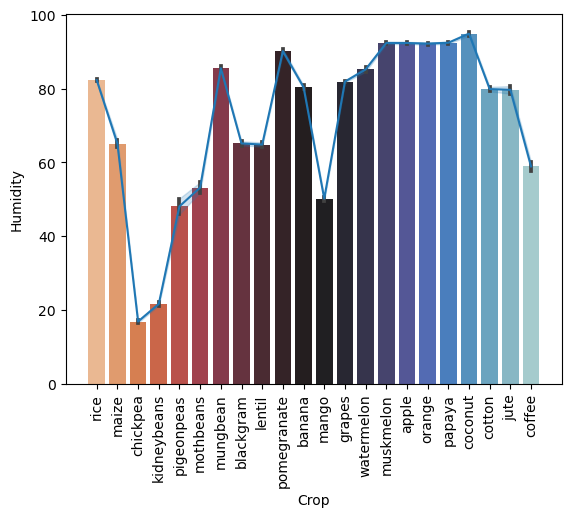

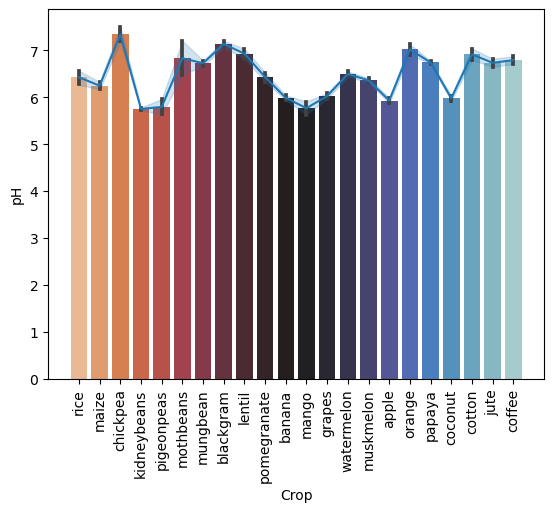

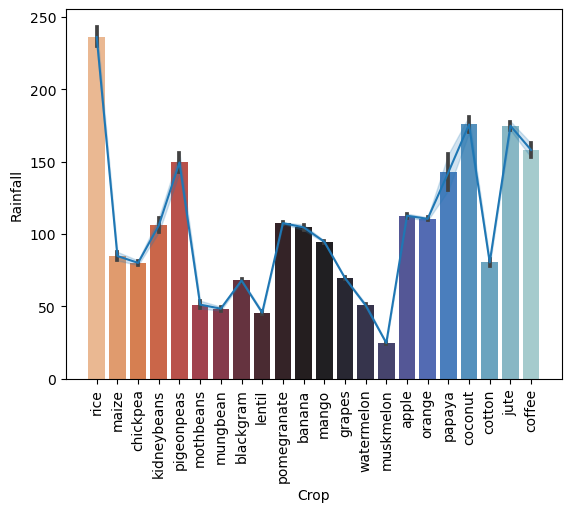

In [4]:
#Visualization using Line Chart & bar chart
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for i in data_columns:
    sns.barplot(x = 'Crop',y = i , data = data_1, palette = "icefire_r")
    sns.lineplot(x = 'Crop',y = i , data = data_1)
    plt.xticks(rotation = 90)
    plt.grid(False)
    plt.show()


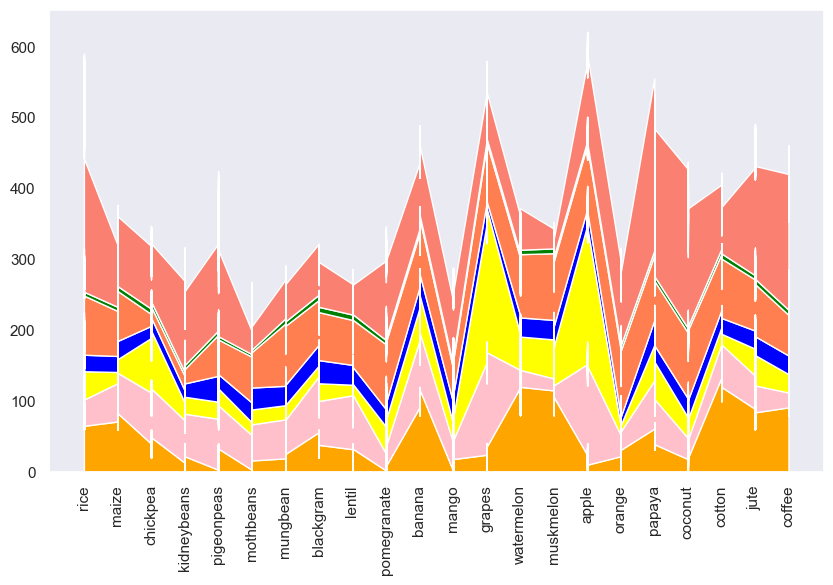

In [9]:
#Visualization using Area Chart
sns.set_theme()
color_map = ['orange', 'pink', "yellow", "blue", "coral", "green", "salmon"]
plt.figure(figsize = (10,6))
plt.stackplot(data_1.Crop, data_1.Nitrogen, data_1.Phosphorus, data_1.Potassium, data_1.Temperature, 
              data_1.Humidity, 
              data_1.pH, data_1.Rainfall, labels = ['Nitrogen', 'Phosphorus', 'Potassium', 
                                                    'Temperature', 'Humidity', 'pH', 'Rainfall'],
              colors=color_map)
plt.xticks(rotation = 90)
plt.grid(False)
plt.show()

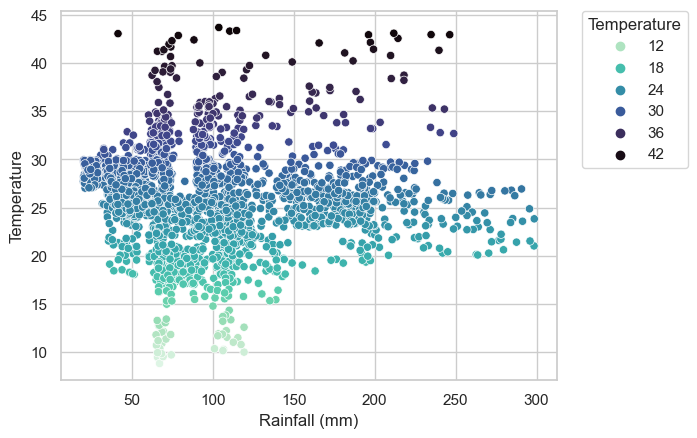

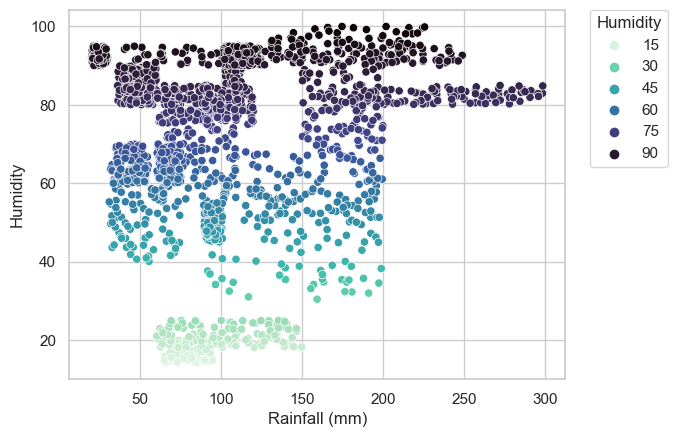

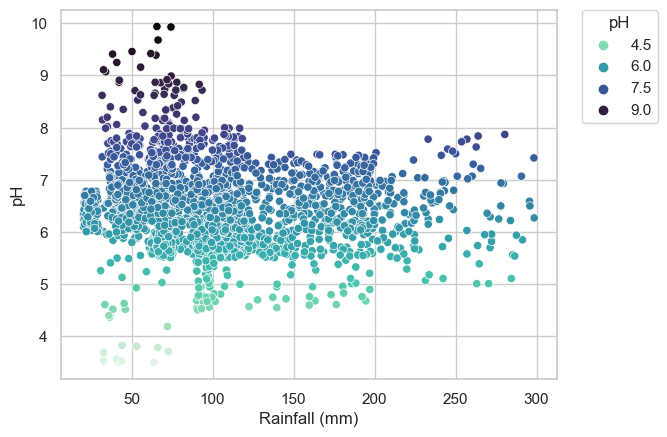

In [119]:
#Visualization using Scatter plot (1)
data_col = ["Temperature", "Humidity", "pH"]
for i in data_col:
    sns.set(style='whitegrid')
    sns.scatterplot(x="Rainfall", y = i, hue = i, data=data_1, palette = "mako_r")
    plt.xlabel('Rainfall (mm)')
    plt.ylabel(i)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = i)
    plt.show()

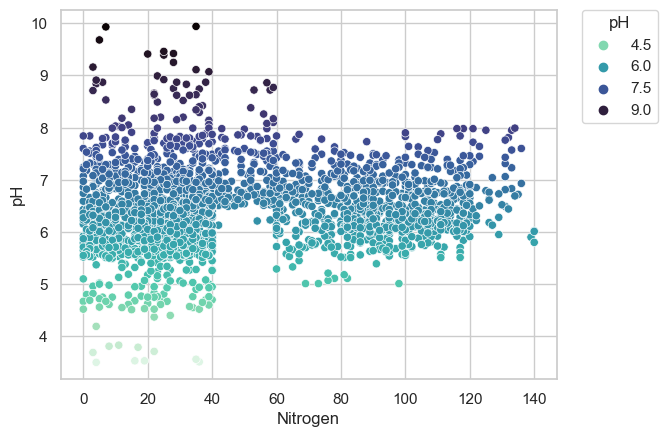

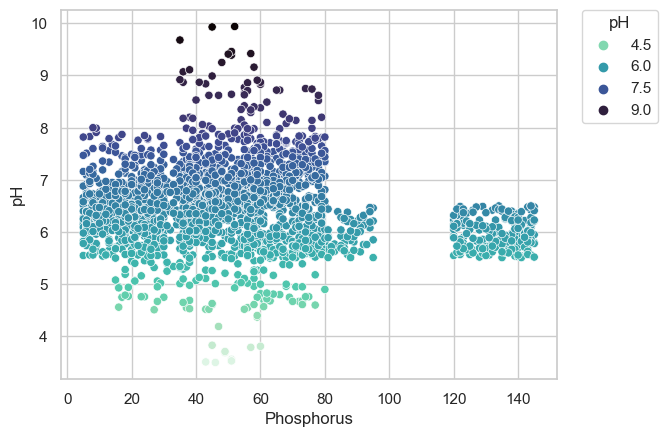

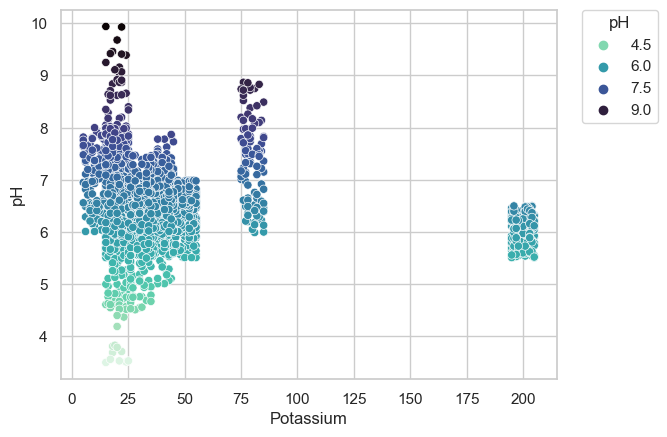

In [121]:
#Visualization using Scatter plot (2)
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium']
for i in data_columns:
    sns.set(style='whitegrid')
    sns.scatterplot(x = i, y="pH", hue="pH", data=data_1, palette = "mako_r")
    plt.xlabel(i)
    plt.ylabel('pH')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0, title = "pH")
    plt.show()

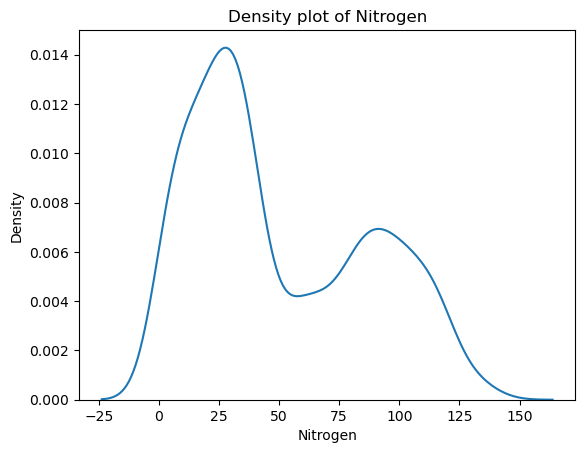

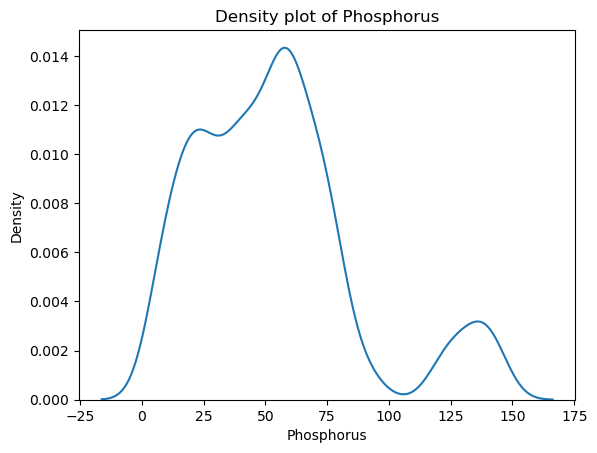

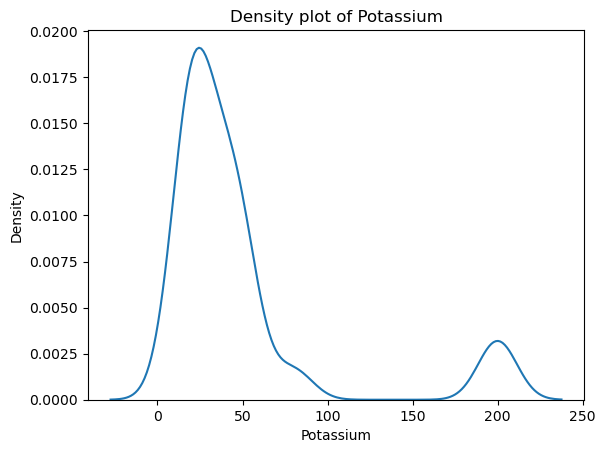

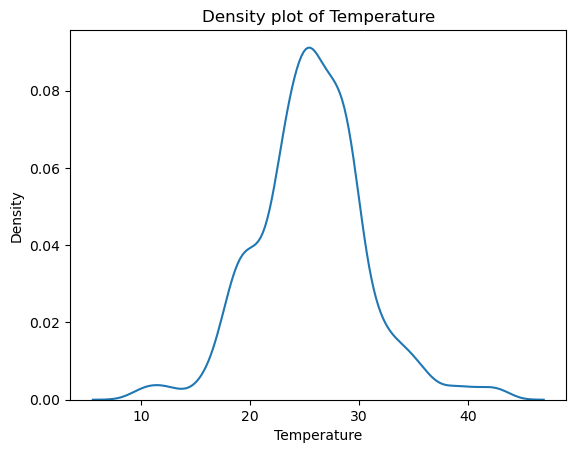

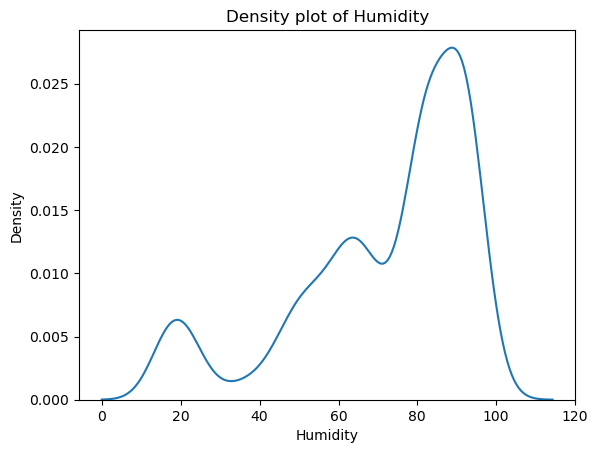

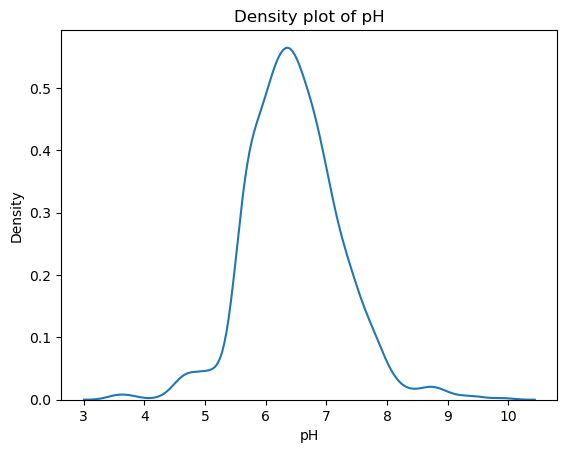

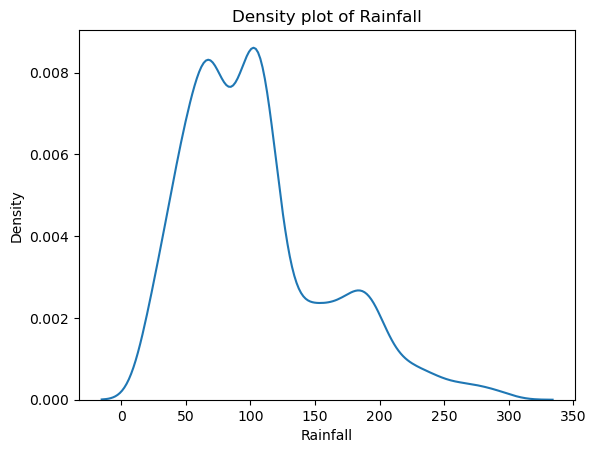

In [36]:
#Visualization using Density plot
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for var in data_columns:
    fig, ax = plt.subplots()
    sns.kdeplot(x = var, data=data_1)
    ax.set_title('Density plot of ' + var)
    plt.show()

QQ plots can be used to compare the distribution of a variable with a chosen distribution (typically a normal distribution as we are doing here). The data are plotted against a theoretical normal distribution (with the same mean and variance as the sample data) in such a way that the points should form an approximate straight line. Departures from this straight line indicate departures from normality. As we found a significant effect in the Kolmogorov Smirnov test we should see points diverging from the line in the plot above with either some outlying values lying away from the line or even the shape of the points forming a non-linear pattern. However, the small departures from normality would not usually prevent us from employing parametric statistical methods.

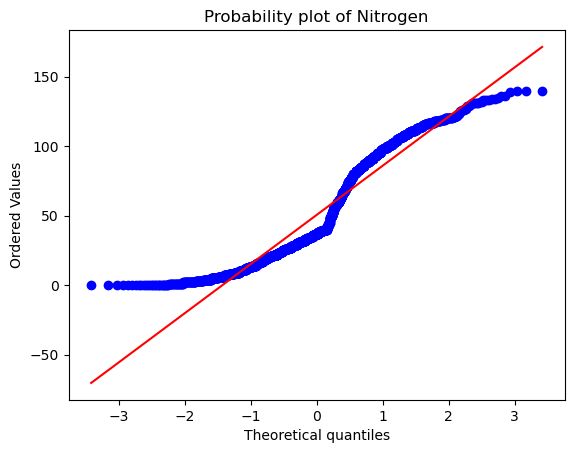

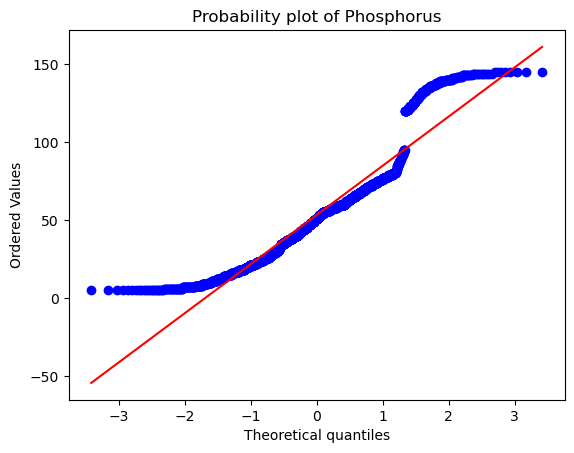

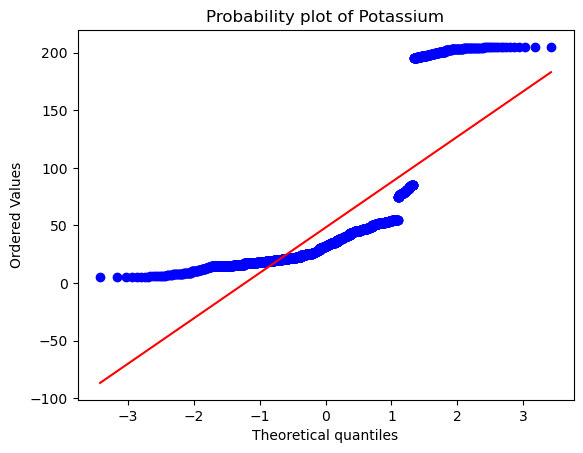

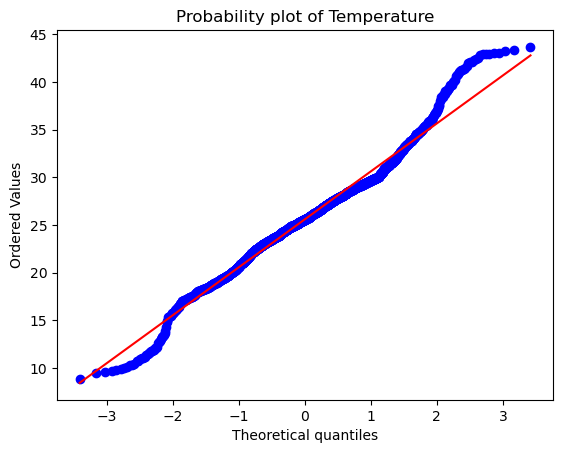

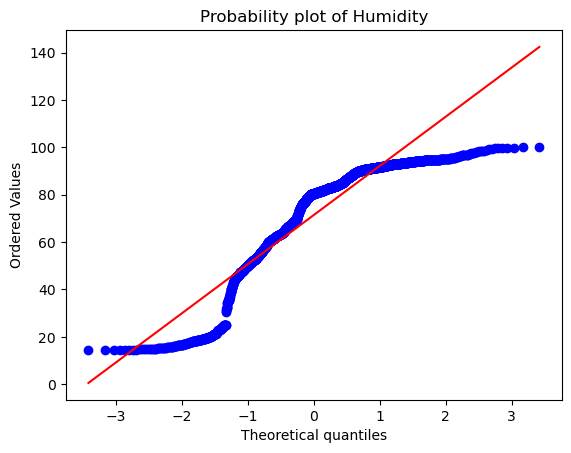

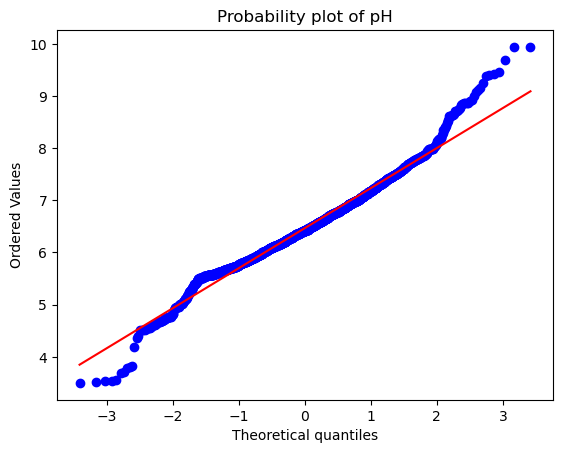

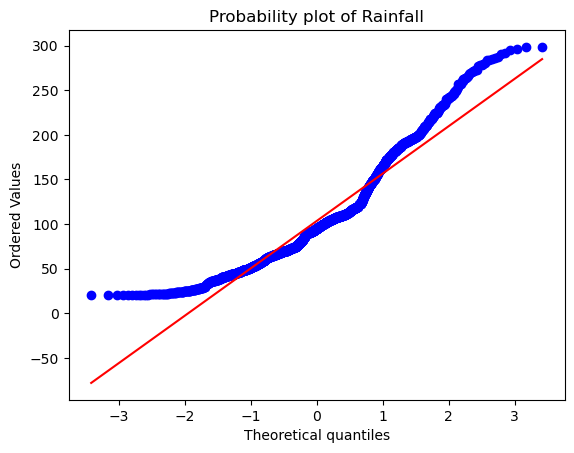

In [12]:
#Normality test
data_columns = ['Nitrogen', 'Phosphorus', 'Potassium', 'Temperature', 'Humidity', 'pH', 'Rainfall']
for var in data_columns:
    fig, ax = plt.subplots()
    stats.probplot(data_1[var], dist = "norm", plot=ax)
    ax.set_title('Probability plot of ' + var)
    plt.show()

Nitrogen: Not Normal 
Phosphorus: Not Normal 
Potassium: Not Normal 
Temperature: Not Normal 
Humidity: Not Normal 
pH: Not Normal 
Rainfall: Not Normal

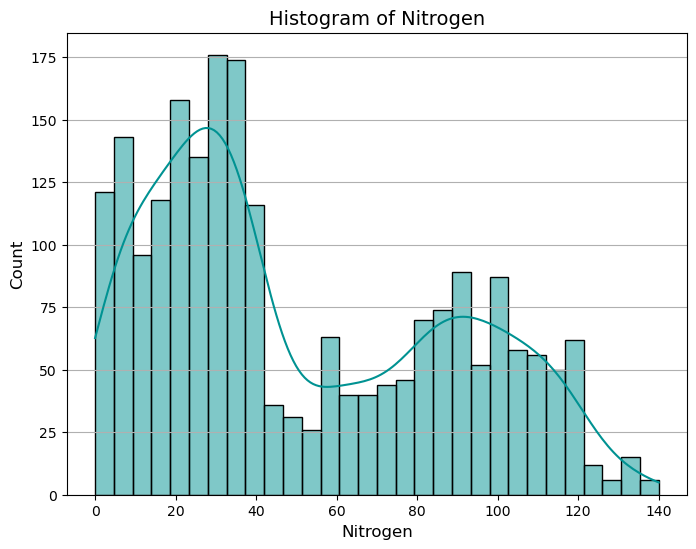

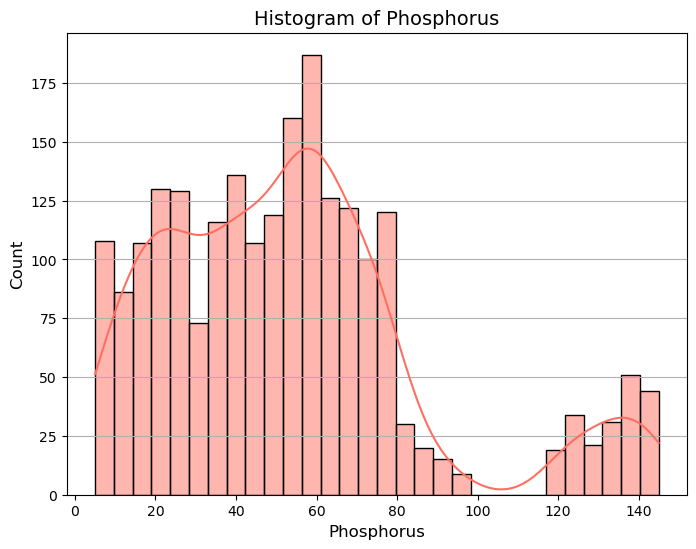

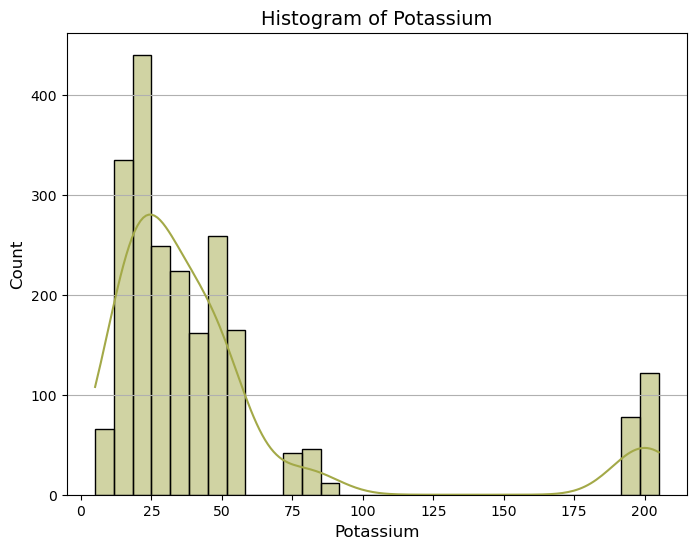

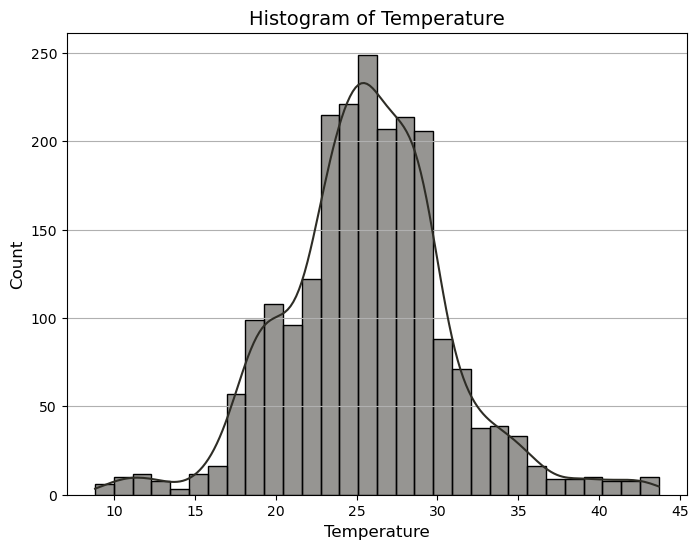

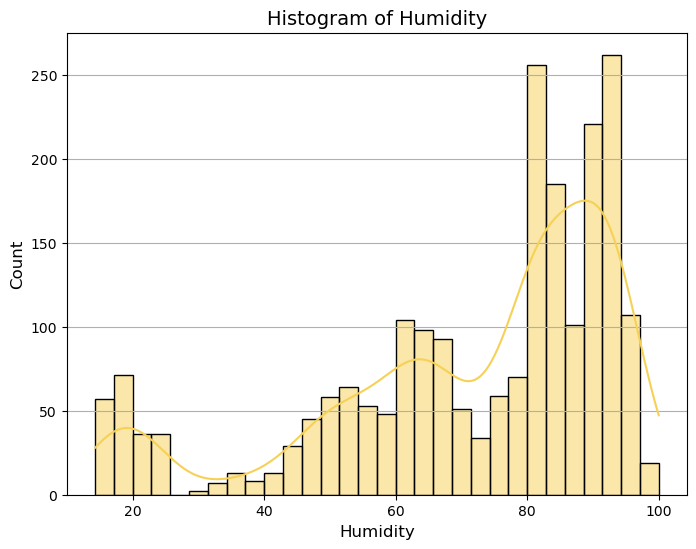

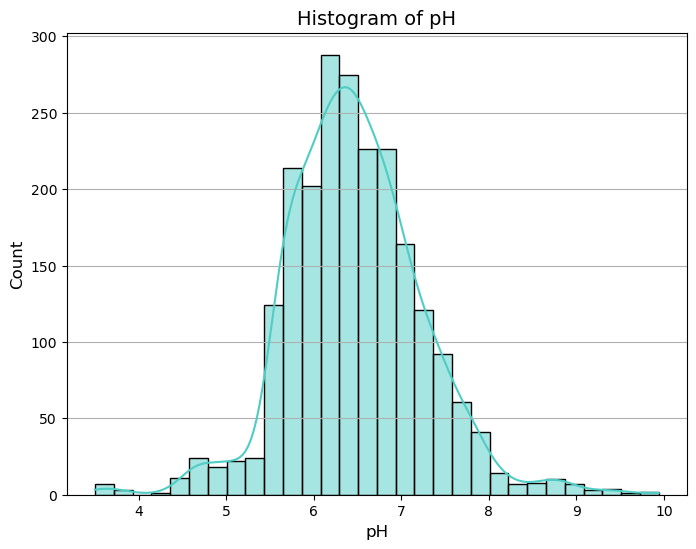

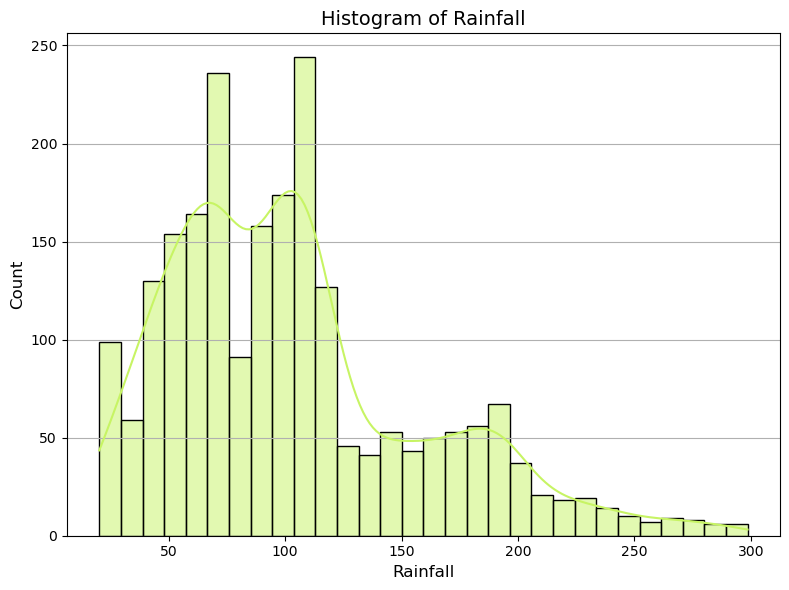

In [3]:
# Set up the color palette
colors = ['#009292', '#FF6F61', '#A3A948', '#2E2D26', '#F6D155', '#4ECDC4', '#C7F464']

# Loop through each variable and plot its histogram
for i, var in enumerate(data_1.columns[:-1]):
    plt.figure(figsize=(8,6))
    sns.histplot(data=data_1, x=var, bins=30, kde=True, color=colors[i])
    plt.xlabel(var, fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title('Histogram of {}'.format(var), fontsize=14)
    plt.grid(axis='y')

# Show the plot
plt.tight_layout()
plt.show()

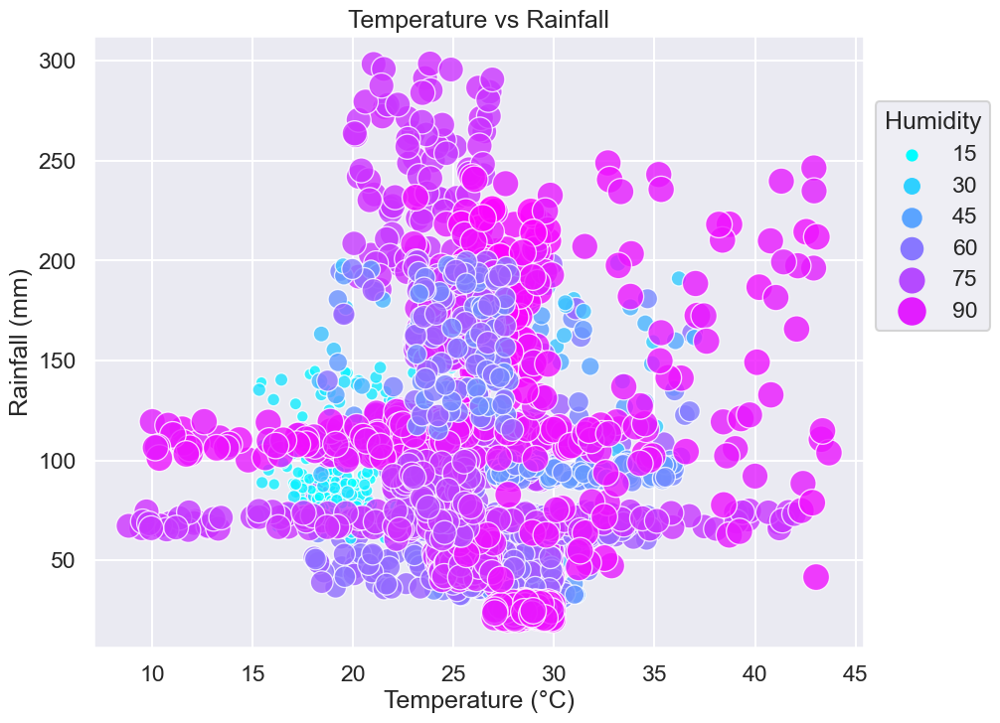

In [4]:
# Set style and context of plot
sns.set_style('darkgrid')
sns.set_context('talk')

# Set figure size
plt.figure(figsize=(10, 8))

# Create scatterplot
sns.scatterplot(x='Temperature', y='Rainfall', 
                data=data_1, hue='Humidity', size='Humidity', sizes=(50, 400), palette='cool', alpha=0.8)

# Set title and axis labels
plt.title('Temperature vs Rainfall')
plt.xlabel('Temperature (°C)')
plt.ylabel('Rainfall (mm)')

# Add legend and adjust placement
plt.legend(title='Humidity', loc='lower left', bbox_to_anchor=(1, 0.5))

# Show plot
plt.show()

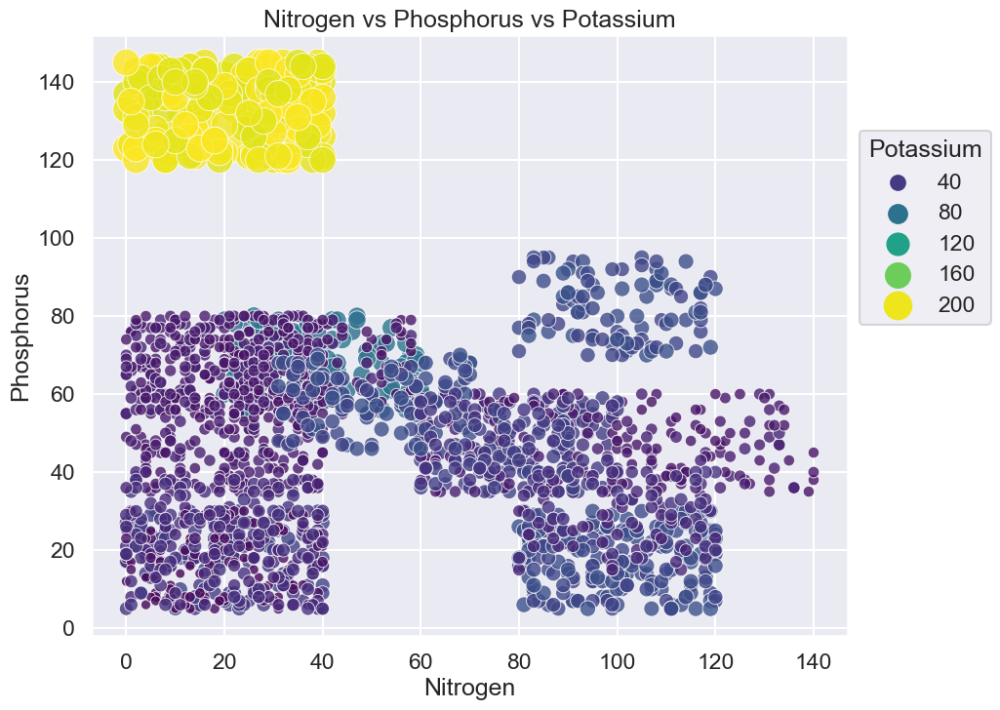

In [5]:
# Set style and context of plot
sns.set_style('darkgrid')
sns.set_context('talk')

# Set figure size
plt.figure(figsize=(10, 8))

# Create scatterplot
sns.scatterplot(x='Nitrogen', y='Phosphorus', 
                data=data_1, hue='Potassium', size='Potassium', sizes=(50, 400), palette='viridis', alpha=0.8)

# Set title and axis labels
plt.title('Nitrogen vs Phosphorus vs Potassium')
plt.xlabel('Nitrogen')
plt.ylabel('Phosphorus')

# Add legend and adjust placement
plt.legend(title='Potassium', loc='lower left', bbox_to_anchor=(1, 0.5))

# Show plot
plt.show()

In [4]:
#After renaming columns
data_1.columns
data_1

,Nitrogen,Phosphorus,Potassium,Temperature,Humidity,pH,Rainfall,Crop
0,90.0,42.0,43.0,20.88,82.00,6.50,202.94,rice
1,85.0,58.0,41.0,21.77,80.32,7.04,226.66,rice
2,60.0,55.0,44.0,23.00,82.32,7.84,263.96,rice
3,74.0,35.0,40.0,26.49,80.16,6.98,242.86,rice
4,78.0,42.0,42.0,20.13,81.60,7.63,262.72,rice
...,...,...,...,...,...,...,...,...
2195,107.0,34.0,32.0,26.77,66.41,6.78,177.77,coffee
2196,99.0,15.0,27.0,27.42,56.64,6.09,127.92,coffee
2197,118.0,33.0,30.0,24.13,67.23,6.36,173.32,coffee
2198,117.0,32.0,34.0,26.27,52.13,6.76,127.18,coffee


C:\Users\HP\AppData\Local\Temp\ipykernel_1848\2948162958.py:2: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  skewness = data_1.skew()
C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\HP\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureW

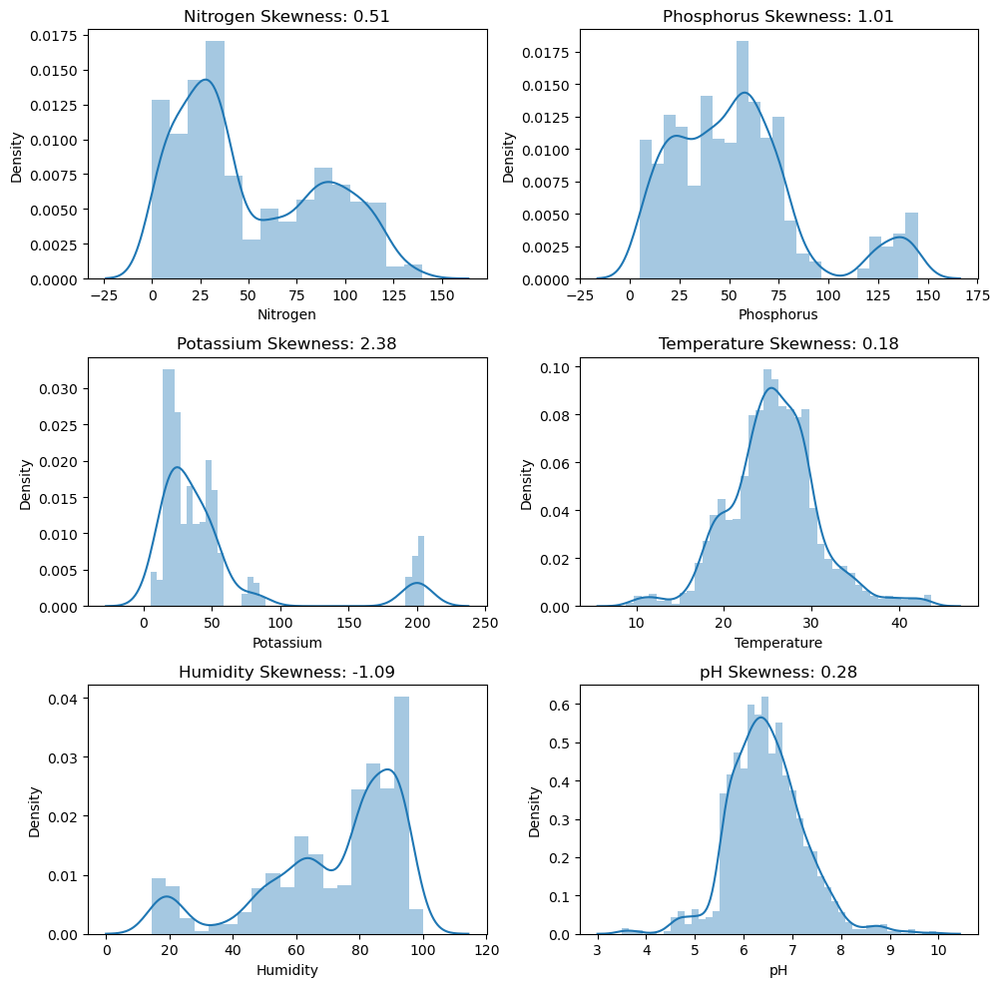

In [6]:
# Create a distribution plot of the skewness for each variable
skewness = data_1.skew()
fig, axs = plt.subplots(nrows=3, ncols=2, figsize=(10, 10))
axs = axs.ravel()
for i, col in enumerate(data_1.columns):
    sns.distplot(data_1[col], ax=axs[i])
    axs[i].set_title(f"{col} Skewness: {skewness[col]:.2f}")
    if i == 5:
        break  # exit loop after plotting the last valid column
plt.tight_layout()
plt.show()

In [4]:
from scipy.stats import pearsonr
# Select the variables of interest
rainfall = data_1['Rainfall']
ph = data_1['pH']
n = data_1['Nitrogen']
p = data_1['Phosphorus']
k = data_1['Potassium']

# Calculate the Pearson correlation coefficient and p-value for each variable
r_ph, p_ph = pearsonr(rainfall, ph)
r_n, p_n = pearsonr(rainfall, n)
r_p, p_p = pearsonr(rainfall, p)
r_k, p_k = pearsonr(rainfall, k)

# Print the results
print(f"Pearson correlation coefficient between rainfall and pH: {r_ph:.3f}, p-value: {p_ph:.3f}")
print(f"Pearson correlation coefficient between rainfall and N: {r_n:.3f}, p-value: {p_n:.3f}")
print(f"Pearson correlation coefficient between rainfall and P: {r_p:.3f}, p-value: {p_p:.3f}")
print(f"Pearson correlation coefficient between rainfall and K: {r_k:.3f}, p-value: {p_k:.3f}")

Pearson correlation coefficient between rainfall and pH: -0.109, p-value: 0.000
Pearson correlation coefficient between rainfall and N: 0.059, p-value: 0.006
Pearson correlation coefficient between rainfall and P: -0.064, p-value: 0.003
Pearson correlation coefficient between rainfall and K: -0.053, p-value: 0.012
